In [2]:
import math
import multiprocessing as mg
import multiprocessing.pool
# import pys2let as ps
import random
import string
import itertools
import os
import jax
jax.config.update("jax_enable_x64", True)
import s2fft
import healpy as hp
import numpy as np
import s2wav
import s2wav
import matplotlib.pyplot as plt
%matplotlib inline 
import skyclean
from skyclean import CMB_data
import concurrent.futures
import time

from s2wav import filters
import numpy as np
import s2wav
import s2fft

In [4]:
def create_folder(folder_name, directory=None):
    """
    Creates a folder at the specified directory. If no directory is specified, it creates the folder in the current working directory.

    Parameters:
        folder_name (str): The name of the folder to create.
        directory (str): The directory in which to create the folder; defaults to the current working directory.

    Returns:
        None
    """
    # Set the path to the current working directory if no directory is provided
    if directory is None:
        directory = os.getcwd()

    # Create the full path for the new folder
    path = os.path.join(directory, folder_name)

    # Check if the folder already exists
    if not os.path.exists(path):
        os.makedirs(path)
        print(f"Folder '{folder_name}' created at {path}")
    else:
        print(f"Folder '{folder_name}' already exists at {path}")

# create_folder("ILC")
# create_folder("wavelet_doubled",  "ILC/")
# create_folder("covariance_matrix",  "ILC/")
# create_folder("weight_vector_data",  "ILC/")


In [5]:
import os

def check_and_create_ilc_directories():
    """
    Checks for the existence of a specific nested directory structure for ILC processing and creates any missing directories.
    This includes handling multiple levels of nested directories as shown in the provided folder structure.

    The structure checked is:
    - ILC
      - covariance_matrix
      - ILC_doubled_maps
      - ILC_processed_wavelet_maps
      - synthesized_ILC_MW_maps
      - wavelet_doubled
      - weight_vector_data
    """

    # Define the root directories
    # base_dir = "path_to_base_directory"  # Set this to your base directory path
    # ilc_dir = os.path.join(base_dir, "ILC")
    ilc_dir = "ILC"
    # List of directories under the ILC directory
    ilc_sub_dirs = ["covariance_matrix", "ILC_doubled_maps", "ILC_processed_wavelet_maps", "synthesized_ILC_MW_maps","wavelet_doubled","weight_vector_data"]

    # Create the ILC directory and its subdirectories
    create_directory(ilc_dir)
    for sub_dir in ilc_sub_dirs:
        create_directory(os.path.join(ilc_dir, sub_dir))

def create_directory(dir_path):
    """
    Checks if a directory exists, and if not, creates it. Prints the status of the directory.
    
    Parameters:
        dir_path (str): The path of the directory to check and create.
    """
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)
        print(f"Created directory: {dir_path}")
    else:
        print(f"Directory already exists: {dir_path}")

# Run the function to check and create directories as needed
check_and_create_ilc_directories()


Directory already exists: ILC
Directory already exists: ILC/covariance_matrix
Directory already exists: ILC/ILC_doubled_maps
Directory already exists: ILC/ILC_processed_wavelet_maps
Directory already exists: ILC/synthesized_ILC_MW_maps
Directory already exists: ILC/wavelet_doubled
Directory already exists: ILC/weight_vector_data


In [2]:
def mw_alm_2_hp_alm(MW_alm, lmax):
    '''MW_alm: 2D array of shape (Lmax, 2*Lmax-1) (MW sampling, McEwen & Wiaux)
    '''
    # Initialize the 1D hp_alm array with the appropriate size
    hp_alm = np.zeros(hp.Alm.getsize(lmax), dtype=np.complex128)
        
    for l in range(lmax + 1):
        for m in range(-l, l + 1):
            index = hp.Alm.getidx(lmax, l, abs(m))
            if m < 0:
                hp_alm[index] = (-1)**m * np.conj(MW_alm[l, lmax + m])
            else:
                hp_alm[index] = MW_alm[l, lmax + m]

    return hp_alm

def visualize_wavelet_coefficient_map(MW_Pix_Map, title, Frequency, min=None, max=None):
    """
    Processes a wavelet coefficient map and visualizes it using HEALPix mollview.
    Parameters:
        original_70: numpy array representing the wavelet coefficient map.
    Returns:
        Displays a mollview map.
    """
    # import healpy as hp  # Make sure to import healpy
    # from s2fft import forward  # Assuming s2fft.forward is imported
    if MW_Pix_Map.shape[0] != 1:
        L_max = MW_Pix_Map.shape[0]
    else:
        L_max = MW_Pix_Map.shape[1]
    original_map_alm = s2fft.forward(MW_Pix_Map, L=L_max)
    # print("Original map alm shape:", original_map_alm.shape)
    
    original_map_hp_alm = mw_alm_2_hp_alm(original_map_alm, L_max - 1)
    original_hp_map = hp.alm2map(original_map_hp_alm, nside=(L_max - 1)//2)

    hp.mollview(
        # original_hp_map * 1e5,
        original_hp_map,
        coord=["G"],
        title=title+Frequency,
        unit=r"K",
        # min=min, max=max,  # Uncomment and adjust these as necessary for better visualization contrast
    )
    return original_hp_map

def Single_Map_doubleworker(MW_Pix_Map):
    '''
    Input: MW_Pix_Map: list of mw maps at different scales 
    Each pixel map is a wavelet pixel map of shape (1, Lmax, 2*Lmax-1) (MW sampling, McEwen & Wiaux)
    It is the output of s2wav.analysis
    (Scale: 0, size (1, 4, 7))

    Process:
    1. Covert MW Pixel Map to MW alm space using s2fft.forward

    2. Add zero to the mw alms  
    
    3. Convert mw alm to mw map 
    
    '''
    MW_alm = s2fft.forward(MW_Pix_Map, L = MW_Pix_Map.shape[1])
    L = MW_alm.shape[0]
    padded_alm = np.zeros((2*L-1,2*(2*L-1)-1),dtype=np.complex128)
    # L = 4 | l = 0,1,2,3 , true lmax is L-1 = 3 | m = -3...0...(L-1)| m = 2(L-1)+1 = 2L-1      
    # double true lmax: 2*3 = 6, and add 1, new L = 7 = 2(L-1)+1 = 2L-1
    # new m = -6...0...(new L-1) | new m = 2*(2L-1)-1
    inner_matrix_middle = MW_alm.shape[1] // 2
    outer_matrix_middle = padded_alm.shape[1] // 2
    start_col = (outer_matrix_middle - inner_matrix_middle)
    end_col = start_col + MW_alm.shape[1] # not included
      
    padded_alm[:MW_alm.shape[0], start_col:end_col] = MW_alm
    # print(padded_alm[:MW_alm.shape[0], start_col:start_col + end_col].shape)
    # print("padded alm size", padded_alm)
    # print(padded_alm.shape)
    
    MW_Pix_Map_doubled = np.real(s2fft.inverse(padded_alm, L = padded_alm.shape[0]))
    # print("Scale:","doubled map size", MW_Pix_Map_doubled.shape)
    # Note
    # assert imaginery part is around zero
    # print(np.imag(MW_Pix_Map_doubled))
    # MW_Pix_Map_doubled = s2fft.inverse(MW_alm_doubled, L = MW_alm_doubled.shape[0])
    
    return MW_Pix_Map_doubled

def smoothed_covariance(MW_Map1, MW_Map2):
    '''
    Input: MW_Map1, MW_Map2: same size MW pixel wavelet maps at different frequencies
    output: R_map: smoothed covariance map beteen MW_Map1 and MW_Map2
    '''
    smoothing_lmax = MW_Map1.shape[0]
    # Get the real part of the map
    map1 = np.real(MW_Map1)
    map2 = np.real(MW_Map2)
    # Covariance matrix
    R_MW_Pixel_map = np.multiply(map1,map2) + 0.j #Add back in zero imaginary part

    # smoothing in harmonic space for efficiency
    R_MW_alm = s2fft.forward(R_MW_Pixel_map, L = smoothing_lmax)

    nsamp = 1200.0
    lmax_at_scale_j = R_MW_alm.shape[0]
    npix = hp.nside2npix(1<<(int(0.5*lmax_at_scale_j)-1).bit_length())
    # (int(0.5*scale_lmax)-1).bit_length() calculates the number of bits necessary to represent the integer int(0.5*scale_lmax)-1 in binary.
    # 1 << (int(0.5*scale_lmax)-1).bit_length() performs a bitwise left shift, essentially calculating 2^(number of bits).
    scale_fwhm = 4.0 * math.sqrt(nsamp / npix)
    # for high resolution maps, it is still the same number pixels sampled by the actual range is smaller.
    # the beam will become very narrow.

    gauss_smooth = hp.gauss_beam(scale_fwhm,lmax=smoothing_lmax-1)
    MW_alm_beam_convolved = np.zeros(R_MW_alm.shape, dtype=np.complex128)

    # Convolve the MW alms with the beam
    for i in range(R_MW_alm.shape[1]):
        MW_alm_beam_convolved[:, i] = R_MW_alm[:, i] * gauss_smooth
    
    R_covariance_map = np.real(s2fft.inverse(MW_alm_beam_convolved, L = smoothing_lmax))

    return R_covariance_map

def load_frequency_data(base_path, file_template, frequencies, scales=None, realization = None):
    """
    Load NumPy arrays from dynamically generated file paths for each frequency and scale.
    
    Args:
        base_path (str): The base path where the files are located.
        file_template (str): The template for the file names, with placeholders for frequency and scale.
        frequencies (list): A list of frequency names.
        scales_: A lists of scales.
        
    Returns:
        dict: A dictionary where keys are tuples of (frequency, scale) and values are loaded NumPy arrays.
    """
    frequency_data = {}
    realization = str(realization).zfill(4)
    for frequency in frequencies:
        for scale in scales:
            # Generate the file path using the template and the current frequency and scale
            path = f"{base_path}/{file_template.format(frequency, scale, realization)}"
            try:
                frequency_data[(frequency, scale)] = np.load(path)
            except Exception as e:
                print(f"Error loading {path} for frequency {frequency} and scale {scale}: {e}, realization {realization}")
    return frequency_data

# def double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization):
#     """
#     Doubles the resolution of wavelet maps and saves them with the realization number in the file name.

#     Args:
#         original_wavelet_c_j (dict): Dictionary containing the original wavelet maps.
#         frequencies (list): List of frequency strings.
#         scales (list): List of scale indices.
#         realization (int): The realization number for file naming.
#     """

#     # Modified for multi-processing i to j, j to i.
#     for j in scales:
#         for i in frequencies:
#             # Perform the doubling of the wavelet map for the given frequency and scale
#             with concurrent.futures.ProcessPoolExecutor() as executor:
#             secs = [5, 4, 3, 2, 1]
#             results = executor.map(do_something, secs)
#             wavelet_MW_Pix_Map_doubled = Single_Map_doubleworker(original_wavelet_c_j[(i, j)])
            
#             # Save the doubled wavelet map with the realization number in the filename
#             # np.save(f"ILC/wavelet_doubled/Wav_Pix2_F{i}_S{j}_R{realization:04d}.npy", wavelet_MW_Pix_Map_doubled)
#             np.save(f"ILC/wavelet_doubled/Wav_Pix2_F{i}_S{j}_R{realization}.npy", wavelet_MW_Pix_Map_doubled)

def double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization):
    """
    Doubles the resolution of wavelet maps and saves them with the realization number in the file name.

    Args:
        original_wavelet_c_j (dict): Dictionary containing the original wavelet maps.
        frequencies (list): List of frequency strings.
        scales (list): List of scale indices.
        realization (int): The realization number for file naming.
    """
    for i in frequencies:
        for j in scales:
            # Perform the doubling of the wavelet map for the given frequency and scale
            wavelet_MW_Pix_Map_doubled = Single_Map_doubleworker(original_wavelet_c_j[(i, j)])
            
            # Save the doubled wavelet map with the realization number in the filename
            # np.save(f"ILC/wavelet_doubled/Wav_Pix2_F{i}_S{j}_R{realization:04d}.npy", wavelet_MW_Pix_Map_doubled)
            np.save(f"ILC/wavelet_doubled/Wav_Pix2_F{i}_S{j}_R{realization}.npy", wavelet_MW_Pix_Map_doubled)

def calculate_covariance_matrix(frequencies, doubled_MW_wav_c_j, scale, realization):
    """
    Calculates the covariance matrices for given frequencies and saves them to disk,
    accommodating any size of the input data arrays.
    
    Args:
    frequencies (list): List of frequency indices.
    doubled_MW_wav_c_j (dict): Dictionary containing data arrays for covariance calculations.
    """
    # Check dimensions of the first item to set the size of the covariance matrices
    if frequencies:
        sample_data = doubled_MW_wav_c_j[(frequencies[0], scale)]
        n_rows, n_cols = sample_data.shape
    else:
        raise ValueError("Frequency list is empty.")
    
    total_frequency = len(frequencies)
    # Initialize a 4D array to store the covariance matrices
    full_array = np.zeros((total_frequency, total_frequency, n_rows, n_cols))

    # Calculate the covariance matrix and save each one
    for i in range(total_frequency):
        for fq in range(i, total_frequency):
            # print(f"Calculating covariance between {frequencies[i]} and {frequencies[fq]}")
            
            full_array[i, fq] = smoothed_covariance(doubled_MW_wav_c_j[(frequencies[i], scale)],
                                                    doubled_MW_wav_c_j[(frequencies[fq], scale)])
            # Save the computed covariance matrix
            # np.save(f"ILC/covariance_matrix/cov_MW_Pix2_F{frequencies[i]}_F{frequencies[fq]}_S{scale}", full_array[i, fq])
    f = '_'.join(frequencies)
    # Fill the symmetric part of the matrix
    for l1 in range(1, total_frequency):
        for l2 in range(l1):
            full_array[l1, l2] = full_array[l2, l1]
            # np.save(f"ILC/covariance_matrix/cov_MW_Pix2_F{frequencies[l1]}_F{frequencies[l2]}_S{scale}", full_array[l1, l2])
    np.save(f"ILC/covariance_matrix/cov_MW_Pix2_F{f}_S{scale}_R{realization}_Full", full_array)
    # print(full_array.shape)
    return full_array

def process_and_save_matrices(R,scale,realization):
    """
    Processes the given 4D matrix R by computing and saving the weight vectors for each matrix in the first two dimensions.
    Also stores results in memory as arrays and saves them to disk. Adjusts the size of the identity vector based on sub-matrix size.

    Args:
    R (np.ndarray): A 4D matrix with dimensions suitable for swapping and inverting.

    Returns:
    np.ndarray, np.ndarray: Arrays containing the inverse matrices and weight vectors.
    """
    # print(R.shape)
    # Swap the axes to get R_Pix
    R_Pix = np.swapaxes(np.swapaxes(R, 0, 2), 1, 3)
    
    # Get dimensions for looping and size of sub-matrices
    dim1, dim2, subdim1, subdim2 = R_Pix.shape
    # print(dim1, dim2, subdim1, subdim2)
    # Create arrays to store inverses and weight vectors
    inverses = np.zeros((dim1, dim2, subdim1, subdim2))
    weight_vectors = np.zeros((dim1, dim2, subdim1))

    # Realiztion 6 has a singular matrix
    # Adjust identity vector size based on sub-matrix dimensions
    identity_vector = np.ones(subdim2, dtype=float)
    singular_matrices_lcoation = []
    singular_matrices = []
    for i in range(dim1):
        for j in range(dim2):
            
            det = np.linalg.det(R_Pix[i, j])
            if det == 0:
                print(i,j)
                print(R_Pix[i, j].shape)
                print(det)
                print(R_Pix[i, j])
                print("The matrix is singular.")
                # np.linalg.inv(R_Pix[i, j])
                zeros = np.zeros((subdim1))

                singular_matrices_lcoation.append((i,j))
                singular_matrices.append(R_Pix[i, j])
                weight_vectors[i, j] = zeros
                np.save(f"ILC/weight_vector_data/inverse_singular_matrix_{i}_{j}_S{scale}_R{realization}.npy", R_Pix[i,j])
                print("saved at ", f"ILC/weight_vector_data/inverse_singular_matrix_{i}_{j}_S{scale}_R{realization}.npy")
                print("zeros for weight vector", zeros.shape)
            else:
                # print("The matrix is not singular.")
                # Invert the matrix at position (i, j)
                inverses[i, j] = np.linalg.inv(R_Pix[i, j])
            
                # Compute the weight vector
                numerator = np.dot(inverses[i, j], identity_vector)
                denominator = np.dot(np.dot(inverses[i, j], identity_vector),identity_vector)
                weight_vectors[i, j] = numerator / denominator
            
            # inverses[i, j] = np.linalg.inv(R_Pix[i, j])
            # # Compute the weight vector
            # numerator = np.dot(inverses[i, j], identity_vector)
            # denominator = np.dot(np.dot(inverses[i, j], identity_vector),identity_vector)
            # weight_vectors[i, j] = numerator / denominator
        
            # Save the inverse matrix and weight vector to disk
            # np.save(f"../weight_vector_data/inverse_matrix_{i}_{j}.npy", inverses[i, j])
            # np.save(f"../weight_vector_data/weight_vector_{i}_{j}.npy", weight_vectors[i, j])
    np.save(f"ILC/weight_vector_data/weight_vector_S{scale}_R{realization}", weight_vectors)
            

    return inverses, weight_vectors,singular_matrices_lcoation,singular_matrices
 
def compute_ILC_for_pixel(i, j, frequencies, scale, weight_vector_load, doubled_MW_wav_c_j):
    pix_vector = np.array([
        doubled_MW_wav_c_j[(frequencies[k], scale)][i, j] for k in range(len(frequencies))
    ])
    return np.dot(weight_vector_load[scale][i, j], pix_vector)

def create_doubled_ILC_map(frequencies, scale, weight_vector_load, doubled_MW_wav_c_j, realization):
    size = doubled_MW_wav_c_j[(frequencies[0],scale)].shape
    doubled_map = np.zeros((size[0], size[1]))
    
    for i in range(doubled_map.shape[0]):
        for j in range(doubled_map.shape[1]):
            doubled_map[i, j] = compute_ILC_for_pixel(i, j, frequencies, scale,weight_vector_load, doubled_MW_wav_c_j)
    np.save(f"ILC/ILC_doubled_maps/ILC_Map_S{scale}_R{realization}", doubled_map)
    return doubled_map

def trim_to_original(MW_Doubled_Map, scale, realization):
    '''
    Input:
        MW_Doubled_Map: The MW Pixel map with increased resolution.
        original_shape: A tuple indicating the original size of the alm data.

    Process:
        1. convet it to alm  
        1. Trim the alm back to its original dimensions.
        2. Convert the trimmed alm array back to a pixel map using an inverse spherical transform.

    Returns:
        MW_Pix_Map_original: The pixel map converted back to its original resolution.
    '''

    # 8,15, 15//2 = 7
    MW_alm_doubled = s2fft.forward(MW_Doubled_Map, L=MW_Doubled_Map.shape[0])
    # print(MW_alm_doubled)
    inner_matrix_vertical = int((MW_Doubled_Map.shape[0]+1) / 2)
    inner_matrix_horizontal = int(2*inner_matrix_vertical - 1)
    
    inner_matrix_middle = inner_matrix_horizontal // 2
    outer_matrix_middle = MW_Doubled_Map.shape[1] // 2
    start_col = (outer_matrix_middle - inner_matrix_middle)
    end_col = start_col + inner_matrix_horizontal # not included

    # Extract the original size part from the doubled alm data
    trimmed_alm = MW_alm_doubled[:inner_matrix_vertical, start_col:end_col]
    print("trimmed alm shape", trimmed_alm.shape)
    # Convert trimmed alm to the original pixel map
    MW_Pix_Map_original = s2fft.inverse(trimmed_alm, L=trimmed_alm.shape[0])[np.newaxis, ...]
    np.save(f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S{scale}_R{realization}", MW_Pix_Map_original)
    return MW_Pix_Map_original
   

In [1]:
pip install skyclean --upgrade

Defaulting to user installation because normal site-packages is not writeable
  Using cached skyclean-0.0.4.2-py3-none-any.whl (15 kB)
  Using cached skyclean-0.0.4.1-py3-none-any.whl (14 kB)
  Using cached skyclean-0.0.4.0-py3-none-any.whl (13 kB)
Note: you may need to restart the kernel to use updated packages.


Processing realization 0000
Doubled and saved wavelet maps in 32.15 seconds
Calculated covariance matrices in 545.99 seconds
Processed and saved matrices in 26.17 seconds
Created ILC maps in 4.72 seconds
Trimmed maps to original resolution in 47.44 seconds
ME alm shape: (4, 7)


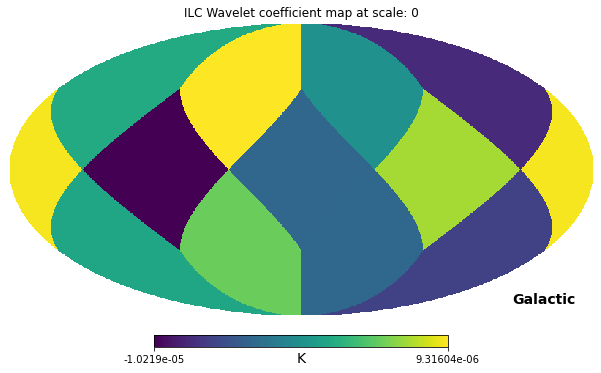

ME alm shape: (4, 7)


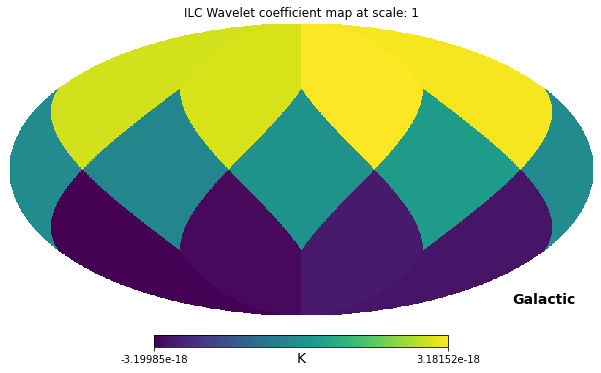

ME alm shape: (8, 15)


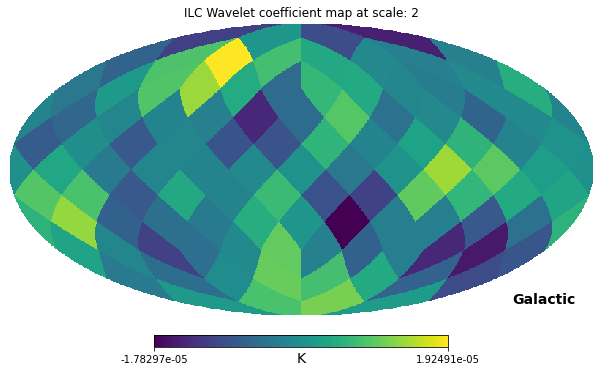

ME alm shape: (16, 31)


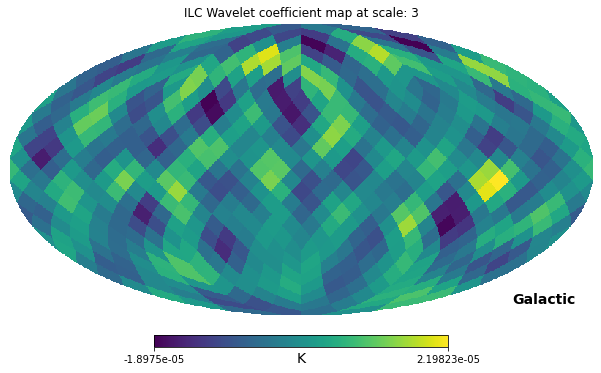

ME alm shape: (32, 63)


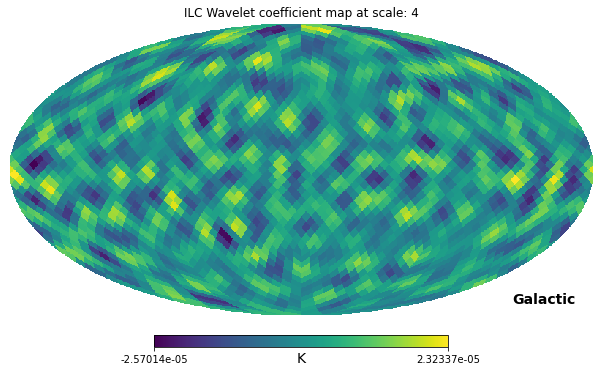

ME alm shape: (64, 127)


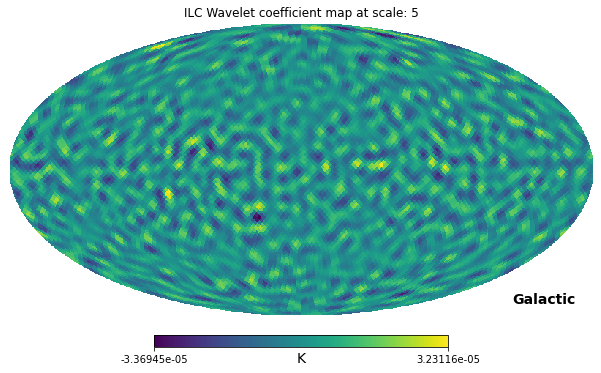

ME alm shape: (128, 255)


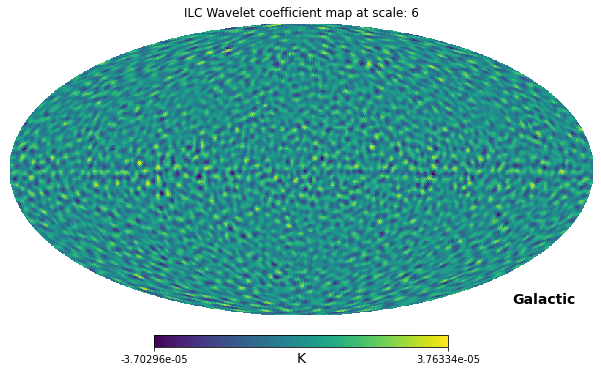

ME alm shape: (256, 511)


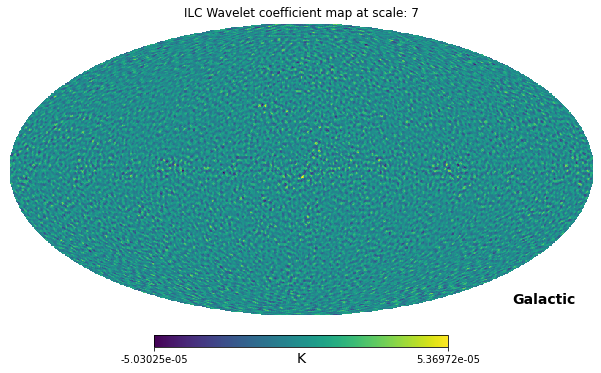

ME alm shape: (256, 511)


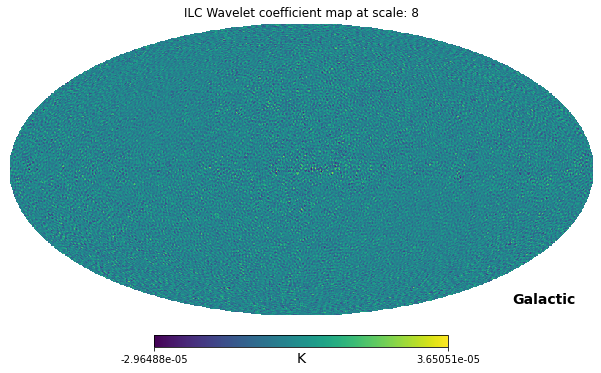

Visualized wavelet coefficient maps in 8.92 seconds
ME alm shape: (256, 511)


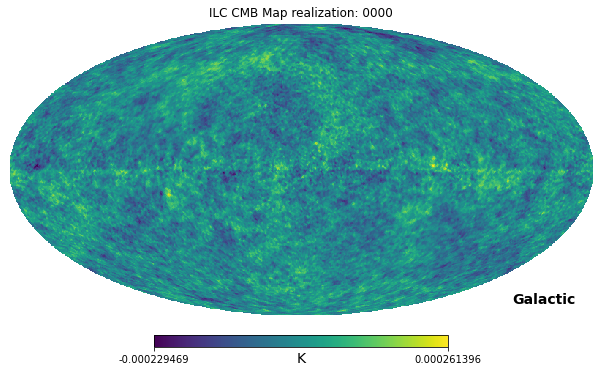

In [5]:
import jax
jax.config.update("jax_enable_x64", True)
import numpy as np
import s2fft
import concurrent.futures
import os
import healpy as hp
import skyclean as sc
import math
import time

import matplotlib.pyplot as plt
%matplotlib inline 
from s2wav import filters
import numpy as np
import s2wav
import s2fft

def mw_alm_2_hp_alm(MW_alm, lmax):
    """
    Converts MW alm coefficients to HEALPix alm coefficients.

    Args:
        MW_alm (ndarray): 2D array of shape (Lmax, 2*Lmax-1) representing MW alm coefficients.
        lmax (int): Maximum multipole moment.

    Returns:
        ndarray: 1D array of HEALPix alm coefficients.
    """
    hp_alm = np.zeros(hp.Alm.getsize(lmax), dtype=np.complex128)
    for l in range(lmax + 1):
        for m in range(-l, l + 1):
            index = hp.Alm.getidx(lmax, l, abs(m))
            if m < 0:
                hp_alm[index] = (-1)**m * np.conj(MW_alm[l, lmax + m])
            else:
                hp_alm[index] = MW_alm[l, lmax + m]
    return hp_alm

def Single_Map_doubleworker(MW_Pix_Map):
    """
    Doubles the resolution of a single wavelet map.

    Args:
        MW_Pix_Map (ndarray): Wavelet pixel map to be doubled in resolution.

    Returns:
        ndarray: Doubled resolution wavelet map.
    """
    MW_alm = s2fft.forward(MW_Pix_Map, L=MW_Pix_Map.shape[1])
    L = MW_alm.shape[0]
    padded_alm = np.zeros((2*L-1, 2*(2*L-1)-1), dtype=np.complex128)
    
    inner_matrix_middle = MW_alm.shape[1] // 2
    outer_matrix_middle = padded_alm.shape[1] // 2
    start_col = outer_matrix_middle - inner_matrix_middle
    end_col = start_col + MW_alm.shape[1]
      
    padded_alm[:MW_alm.shape[0], start_col:end_col] = MW_alm
    MW_Pix_Map_doubled = np.real(s2fft.inverse(padded_alm, L=padded_alm.shape[0]))
    
    return MW_Pix_Map_doubled

def smoothed_covariance(MW_Map1, MW_Map2):
    """
    Computes smoothed covariance between two wavelet maps.

    Args:
        MW_Map1 (ndarray): First wavelet map.
        MW_Map2 (ndarray): Second wavelet map.

    Returns:
        ndarray: Smoothed covariance map.
    """
    smoothing_lmax = MW_Map1.shape[0]
    map1 = np.real(MW_Map1)
    map2 = np.real(MW_Map2)
    R_MW_Pixel_map = np.multiply(map1, map2) + 0.j

    R_MW_alm = s2fft.forward(R_MW_Pixel_map, L=smoothing_lmax)
    nsamp = 1200.0
    lmax_at_scale_j = R_MW_alm.shape[0]
    npix = hp.nside2npix(1 << (int(0.5*lmax_at_scale_j)-1).bit_length())
    scale_fwhm = 4.0 * math.sqrt(nsamp / npix)
    gauss_smooth = hp.gauss_beam(scale_fwhm, lmax=smoothing_lmax-1)
    MW_alm_beam_convolved = np.zeros(R_MW_alm.shape, dtype=np.complex128)

    for i in range(R_MW_alm.shape[1]):
        MW_alm_beam_convolved[:, i] = R_MW_alm[:, i] * gauss_smooth
    
    R_covariance_map = np.real(s2fft.inverse(MW_alm_beam_convolved, L=smoothing_lmax))
    return R_covariance_map


def load_frequency_data(file_template, frequencies, scales, realization):
    """
    Loads wavelet data from files for different frequencies and scales.

    Args:
        base_path (str): Base directory containing the wavelet files.
        file_template (str): Template string for file paths with placeholders for frequency, scale, and realization.
        frequencies (list): List of frequency strings.
        scales (list): List of scale indices.
        realization (str): Realization identifier as a string.

    Returns:
        dict: Dictionary where keys are tuples (frequency, scale) and values are loaded wavelet data arrays.
    """
    
    frequency_data = {}
    realization = str(realization).zfill(4)
    for frequency in frequencies:
        for scale in scales:
            path = f"{file_template.format(frequency=frequency, scale=scale, realization=realization)}"
            # print(path)
            try:
                frequency_data[(frequency, scale)] = np.load(path)
            except Exception as e:
                print(f"Error loading {path} for frequency {frequency} and scale {scale}: {e}, realization {realization}")
    return frequency_data

def save_doubled_wavelet_map(args):
    """
    Helper function to save a doubled wavelet map.

    Args:
        args (tuple): Contains the wavelet map data, frequency, scale, realization, and path template.
    """
    original_map, frequency, scale, realization, path_template = args
    doubled_map = Single_Map_doubleworker(original_map)
    save_path = path_template.format(frequency=frequency, scale=scale, realization=realization)
    np.save(save_path, doubled_map)

def double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization, path_template):
    """
    Doubles and saves wavelet maps using multiprocessing.

    Args:
        original_wavelet_c_j (dict): Dictionary containing the original wavelet maps.
        frequencies (list): List of frequency strings.
        scales (list): List of scale indices.
        realization (str): The realization number for file naming.
        path_template (str): Template for saving the doubled wavelet maps.
    """
    tasks = [(original_wavelet_c_j[(i, j)], i, j, realization, path_template) for i in frequencies for j in scales]
    
    with concurrent.futures.ProcessPoolExecutor() as executor:
        executor.map(save_doubled_wavelet_map, tasks)


# def save_covariance_matrix(args):
#     """
#     Helper function to compute and save the smoothed covariance matrix.

#     Args:
#         args (tuple): Contains the wavelet maps, frequencies, scale, realization, and path template.
#     """
#     MW_Map1, MW_Map2, frequency1, frequency2, scale, realization, path_template = args
#     covariance_matrix = smoothed_covariance(MW_Map1, MW_Map2)
#     save_path = path_template.format(frequency1=frequency1, frequency2=frequency2, scale=scale, realization=realization)
#     np.save(save_path, covariance_matrix)
# def calculate_covariance_matrix(frequencies, doubled_MW_wav_c_j, scale, realization, path_template):
#     """
#     Calculates covariance matrices for the correct number of frequencies.
#     """
#     total_frequency = len(frequencies)
#     tasks = []
    
#     for i in range(total_frequency):
#         for fq in range(i, total_frequency):
#             tasks.append((doubled_MW_wav_c_j[(frequencies[i], scale)],
#                           doubled_MW_wav_c_j[(frequencies[fq], scale)],
#                           frequencies[i], frequencies[fq], scale, realization, path_template))
    
#     with concurrent.futures.ProcessPoolExecutor() as executor:
#         executor.map(save_covariance_matrix, tasks)


import numpy as np
import concurrent.futures

# def compute_covariance(i, fq, frequencies, scale, doubled_MW_wav_c_j):
#     """
#     Computes the covariance between two frequency maps at a given scale.
    
#     Args:
#     i (int): Index of the first frequency.
#     fq (int): Index of the second frequency.
#     frequencies (list): List of frequency strings.
#     scale (int): The scale index.
#     doubled_MW_wav_c_j (dict): Dictionary containing data arrays for covariance calculations.
    
#     Returns:
#     tuple: A tuple containing indices i, fq and the computed covariance matrix.
#     """
#     key_i = (frequencies[i], scale)
#     key_fq = (frequencies[fq], scale)
#     if key_i not in doubled_MW_wav_c_j or key_fq not in doubled_MW_wav_c_j:
#         raise KeyError(f"Missing data for keys {key_i} or {key_fq}.")
#     return i, fq, smoothed_covariance(doubled_MW_wav_c_j[key_i], doubled_MW_wav_c_j[key_fq])

# def calculate_covariance_matrix(frequencies, doubled_MW_wav_c_j, scale, realization, path_template):
#     """
#     Calculates the covariance matrices for all given frequencies and saves them to disk using a provided template,
#     accommodating any size of the input data arrays using multiprocessing.

#     Args:
#     frequencies (list): List of frequency indices.
#     doubled_MW_wav_c_j (dict): Dictionary containing data arrays for covariance calculations.
#     scale (int): The scale index.
#     realization (str): The realization identifier.
#     path_template (str): Template string for saving the covariance matrices, with placeholders for combined frequencies, scale, and realization.
#     """
#     if frequencies:
#         sample_data = doubled_MW_wav_c_j.get((frequencies[0], scale))
#         if sample_data is None:
#             raise KeyError(f"Data for frequency '{frequencies[0]}' and scale '{scale}' is missing.")
#         n_rows, n_cols = sample_data.shape
#     else:
#         raise ValueError("Frequency list is empty.")
    
#     total_frequency = len(frequencies)
#     full_array = np.zeros((total_frequency, total_frequency, n_rows, n_cols))

#     tasks = [(i, fq, frequencies, scale, doubled_MW_wav_c_j) for i in range(total_frequency) for fq in range(i, total_frequency)]

#     with concurrent.futures.ProcessPoolExecutor() as executor:
#         results = executor.map(compute_covariance, *zip(*tasks))
#         for i, fq, covariance_matrix in results:
#             full_array[i, fq] = covariance_matrix
#     np.save("ILC/covariance_matrix/half_cov", full_array)
#     for l1 in range(1, total_frequency):
#         for l2 in range(l1):
#             full_array[l1, l2] = full_array[l2, l1]
    
#     f_str = '_'.join(frequencies)
#     save_path = path_template.format(frequencies=f_str, scale=scale, realization=realization)
#     np.save(save_path, full_array)

#     return full_array

import numpy as np
import concurrent.futures

def compute_covariance(task):
    """
    Computes the covariance between two frequency maps at a given scale.
    
    Args:
    task (tuple): A tuple containing (i, fq, frequencies, scale, doubled_MW_wav_c_j).
    
    Returns:
    tuple: A tuple containing indices i, fq and the computed covariance matrix.
    """
    i, fq, frequencies, scale, doubled_MW_wav_c_j = task
    key_i = (frequencies[i], scale)
    key_fq = (frequencies[fq], scale)
    if key_i not in doubled_MW_wav_c_j or key_fq not in doubled_MW_wav_c_j:
        raise KeyError(f"Missing data for keys {key_i} or {key_fq}.")
    return i, fq, smoothed_covariance(doubled_MW_wav_c_j[key_i], doubled_MW_wav_c_j[key_fq])

def calculate_covariance_matrix(frequencies, doubled_MW_wav_c_j, scale, realization, path_template):
    """
    Calculates the covariance matrices for all given frequencies and saves them to disk using a provided template,
    accommodating any size of the input data arrays using multiprocessing.

    Args:
    frequencies (list): List of frequency indices.
    doubled_MW_wav_c_j (dict): Dictionary containing data arrays for covariance calculations.
    scale (int): The scale index.
    realization (str): The realization identifier.
    path_template (str): Template string for saving the covariance matrices, with placeholders for combined frequencies, scale, and realization.
    """
    if frequencies:
        sample_data = doubled_MW_wav_c_j.get((frequencies[0], scale))
        if sample_data is None:
            raise KeyError(f"Data for frequency '{frequencies[0]}' and scale '{scale}' is missing.")
        n_rows, n_cols = sample_data.shape
    else:
        raise ValueError("Frequency list is empty.")
    
    total_frequency = len(frequencies)
    full_array = np.zeros((total_frequency, total_frequency, n_rows, n_cols))

    tasks = [(i, fq, frequencies, scale, doubled_MW_wav_c_j) for i in range(total_frequency) for fq in range(i, total_frequency)]

    with concurrent.futures.ProcessPoolExecutor() as executor:
        results = executor.map(compute_covariance, tasks)
        for result in results:
            i, fq, covariance_matrix = result
            full_array[i, fq] = covariance_matrix
    # np.save(f"ILC/covariance_matrix/half_cov_1_{scale}", full_array)
    # Fill the symmetric part of the matrix
    for l1 in range(1, total_frequency):
        for l2 in range(l1):
            full_array[l1, l2] = full_array[l2, l1]

    f_str = '_'.join(frequencies)
    save_path = path_template.format(frequencies=f_str, scale=scale, realization=realization)
    np.save(save_path, full_array)

    return full_array



def process_and_save_matrices(R, scale, realization, processed_matrix_template):
    """
    Processes and saves matrices based on the correct number of frequencies.

    Args:
        R (np.ndarray): The input matrix, either 2D or 4D.
        scale (int): The scale index.
        realization (str): The realization identifier.
        processed_matrix_template (str): Template for saving the processed matrices.

    Returns:
        tuple: The inverses, weight vectors, and locations of singular matrices.
    """
    if R.ndim == 4:
        R_Pix = np.swapaxes(np.swapaxes(R, 0, 2), 1, 3)
        dim1, dim2 = R_Pix.shape[:2]
        subdim1, subdim2 = R_Pix.shape[2:]
    elif R.ndim == 2:
        R_Pix = R
        dim1, dim2 = 1, 1
        subdim1, subdim2 = R_Pix.shape
    else:
        raise ValueError(f"Unexpected array dimension: {R.ndim}")

    identity_vector = np.ones(subdim2, dtype=float)
    inverses = np.zeros((dim1, dim2, subdim1, subdim2)) if R.ndim == 4 else np.zeros((subdim1, subdim2))
    weight_vectors = np.zeros((dim1, dim2, subdim1)) if R.ndim == 4 else np.zeros(subdim1)
    singular_matrices_location = []

    for i in range(dim1):
        for j in range(dim2):
            try:
                if R.ndim == 4:
                    inverse_matrix = np.linalg.inv(R_Pix[i, j])
                    inverses[i, j] = inverse_matrix
                    numerator = np.dot(inverse_matrix, identity_vector)
                    denominator = np.dot(numerator, identity_vector)
                    weight_vectors[i, j] = numerator / denominator
                else:
                    inverse_matrix = np.linalg.inv(R_Pix)
                    inverses = inverse_matrix
                    numerator = np.dot(inverse_matrix, identity_vector)
                    denominator = np.dot(numerator, identity_vector)
                    weight_vectors = numerator / denominator
            except np.linalg.LinAlgError:
                singular_matrices_location.append((i, j))
                singular_matrix_path = processed_matrix_template.format(
                    type="inverse_singular_matrix", scale=scale, realization=realization, i=i, j=j
                )
                np.save(singular_matrix_path, R_Pix[i, j] if R.ndim == 4 else R_Pix)
                if R.ndim == 4:
                    weight_vectors[i, j] = np.zeros(len(identity_vector))
                else:
                    weight_vectors = np.zeros(len(identity_vector))

    np.save(processed_matrix_template.format(type="weight_vector", scale=scale, realization=realization), weight_vectors)
    return inverses, weight_vectors, singular_matrices_location



def process_matrix_worker(args):
    """
    Worker function for processing a single matrix in parallel.

    Args:
        args (tuple): Arguments including the matrix to process, indices, and paths for saving.
    """
    R_Pix_ij, i, j, scale, realization, identity_vector, inverses, weight_vectors, singular_matrices_location, path_template = args
    
    try:
        inverses[i, j] = np.linalg.inv(R_Pix_ij)
        numerator = np.dot(inverses[i, j], identity_vector)
        denominator = np.dot(numerator, identity_vector)
        weight_vectors[i, j] = numerator / denominator
    except np.linalg.LinAlgError:
        singular_matrices_location.append((i, j))
        np.save(path_template.format(type="inverse_singular_matrix", scale=scale, realization=realization, i=i, j=j), R_Pix_ij)
        weight_vectors[i, j] = np.zeros(len(identity_vector))




def compute_ILC_for_pixel(i, j, frequencies, scale, weight_vector_load, doubled_MW_wav_c_j):
    pix_vector = np.array([
        doubled_MW_wav_c_j[(frequencies[k], scale)][i, j] for k in range(len(frequencies))
    ])
    return np.dot(weight_vector_load[scale][i, j], pix_vector)

def create_doubled_ILC_map(frequencies, scale, weight_vector_load, doubled_MW_wav_c_j, realization):
    size = doubled_MW_wav_c_j[(frequencies[0],scale)].shape
    doubled_map = np.zeros((size[0], size[1]))
    
    for i in range(doubled_map.shape[0]):
        for j in range(doubled_map.shape[1]):
            doubled_map[i, j] = compute_ILC_for_pixel(i, j, frequencies, scale,weight_vector_load, doubled_MW_wav_c_j)
    np.save(f"ILC/ILC_doubled_maps/ILC_Map_S{scale}_R{realization}_MP", doubled_map)
    return doubled_map




def trim_to_original(MW_Doubled_Map, scale, realization, path_template):
    """
    Trims the doubled map to its original resolution.

    Args:
        MW_Doubled_Map (ndarray): Doubled wavelet map to be trimmed.
        scale (int): Scale index.
        realization (str): The realization number for file naming.
        path_template (str): Template for saving the trimmed maps.

    Returns:
        ndarray: Trimmed wavelet map.
    """
    MW_alm_doubled = s2fft.forward(MW_Doubled_Map, L=MW_Doubled_Map.shape[0])
    inner_matrix_vertical = (MW_Doubled_Map.shape[0] + 1) // 2
    inner_matrix_horizontal = 2 * inner_matrix_vertical - 1
    
    inner_matrix_middle = inner_matrix_horizontal // 2
    outer_matrix_middle = MW_Doubled_Map.shape[1] // 2
    start_col = outer_matrix_middle - inner_matrix_middle
    end_col = start_col + inner_matrix_horizontal

    trimmed_alm = MW_alm_doubled[:inner_matrix_vertical, start_col:end_col]
    MW_Pix_Map_original = s2fft.inverse(trimmed_alm, L=trimmed_alm.shape[0])[np.newaxis, ...]
    np.save(path_template.format(scale=scale, realization=realization), MW_Pix_Map_original)
    return MW_Pix_Map_original



def visualize_MW_Pix_map(MW_Pix_Map, title, coord=["G"], unit = r"K", is_MW_alm = False):
    """
    Processes a MW pixel wavelet coefficient map and visualizes it using HEALPix mollview.

    Parameters:
        MW_Pix_Map (numpy array): Array representing the wavelet coefficient map.
        title (str): Title for the visualization plot.

    Returns:
        Only Displays a mollview map.
    """
    if not is_MW_alm:
        # The newly generated wavelet coefficient map is in three dimensions
        if len(MW_Pix_Map.shape) == 3:
            L_max = MW_Pix_Map.shape[1]
        else:
            L_max = MW_Pix_Map.shape[0]
        original_map_alm = s2fft.forward(MW_Pix_Map, L=L_max)
        print("ME alm shape:", original_map_alm.shape)
    else:
        original_map_alm = MW_Pix_Map
        L_max = original_map_alm.shape[0]
    original_map_hp_alm = mw_alm_2_hp_alm(original_map_alm, L_max - 1)
    original_hp_map = hp.alm2map(original_map_hp_alm, nside=(L_max - 1)//2)

    hp.mollview(
        original_hp_map,
        coord=coord,
        title=title,
        unit=unit,
        # min=min, max=max,  # Uncomment and adjust these as necessary for better visualization contrast
    )
    # plt.figure(dpi=1200)
    plt.show()



def synthesize_ILC_maps(trimmed_maps, realization, output_templates, L_max, N_directions):
    """
    Synthesizes ILC maps from trimmed wavelet maps, visualizes the results, and saves the synthesized maps.

    Args:
        trimmed_maps (list of np.ndarray): List of trimmed wavelet maps for different scales.
        realization (str): The realization identifier.
        output_templates (dict): Dictionary of output path templates for different processing steps.
        L_max (int): Maximum spherical harmonic degree.
        N_directions (int): Number of directions for the directional wavelet filters.

    Returns:
        np.ndarray: The synthesized ILC map.
    """
    
    # Load the scaling coefficients using the template path
    f_scal = np.load(output_templates['f_scal'].format(realization=realization))

    # Create the directional filters
    filter = filters.filters_directional_vectorised(L_max, N_directions)

    # Perform the synthesis to obtain the ILC map
    MW_Pix = s2wav.synthesis(trimmed_maps, L=L_max, f_scal=f_scal, filters=filter, N=1)

    # Visualize the synthesized ILC map
    title = f"ILC CMB Map realization: {realization}"
    visualize_MW_Pix_map(MW_Pix, title)

    # Save the synthesized ILC map
    np.save(output_templates['synthesized_maps'].format(realization=realization), MW_Pix)
    
    return MW_Pix



def process_wavelet_maps_MP(file_template, frequencies, scales, realizations, output_templates, L_max, N_directions):
    
    """
    Processes wavelet maps for a range of realizations, including doubling, covariance calculation,
    matrix processing, and trimming to original resolution, using multiprocessing for efficiency
    where tasks are independent.

    Args:
        file_template (str): Template string for file paths with placeholders for frequency, scale, and realization.
        frequencies (list): List of frequency strings.
        scales (list): List of scale indices.
        realizations (list): List of realizations to process.
        output_templates (dict): Dictionary of output path templates for different processing steps.
        
    Returns:
        list: List of trimmed maps for the final processed realization.
    """

    synthesized_maps = []

    for realization in realizations:
        realization_str = str(realization).zfill(4)
        print(f"Processing realization {realization_str}")
        path = output_templates['trimmed_maps'].format(scale=scales[0], realization=realization_str)
        
        # Timing for loading the original wavelet maps
        # start_time = time.perf_counter()
        original_wavelet_c_j = load_frequency_data(file_template, frequencies, scales, realization_str)
        # load_time = time.perf_counter() - start_time
        # print(f'Loaded original wavelet maps in {load_time:.2f} seconds')

        # Timing for doubling and saving wavelet maps
        start_time = time.perf_counter()
        double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization_str, output_templates['doubled_maps'])
        double_time = time.perf_counter() - start_time
        print(f'Doubled and saved wavelet maps in {double_time:.2f} seconds')

        # loading doubled wavelet maps
        doubled_MW_wav_c_j = load_frequency_data(output_templates['doubled_maps'], frequencies, scales, realization_str)
       

        # Timing for calculating covariance matrices with multiprocessing
        start_time = time.perf_counter()
        with concurrent.futures.ProcessPoolExecutor() as executor:
            covariance_tasks = [
                executor.submit(
                    calculate_covariance_matrix,
                    frequencies, doubled_MW_wav_c_j, scale, realization_str, output_templates['covariance_matrices']
                )
                for scale in scales
            ]
            for future in concurrent.futures.as_completed(covariance_tasks):
                future.result()  # Wait for all tasks to complete
        covariance_time = time.perf_counter() - start_time
        print(f'Calculated covariance matrices in {covariance_time:.2f} seconds')

        # Timing for processing and saving matrices with multiprocessing
        start_time = time.perf_counter()
        F_str = '_'.join(frequencies)
        R_covariance = [
            np.load(output_templates['covariance_matrices'].format(
                frequencies=F_str, scale=i, realization=realization_str))
            for i in range(len(scales))
        ]
        
        with concurrent.futures.ProcessPoolExecutor() as executor:
            process_tasks = [
                executor.submit(
                    process_and_save_matrices,
                    R_covariance[scale_idx], scale, realization_str, output_templates['processed_matrices']
                )
                for scale_idx, scale in enumerate(scales)
            ]
            for future in concurrent.futures.as_completed(process_tasks):
                future.result()  # Wait for all tasks to complete
        process_time = time.perf_counter() - start_time
        print(f'Processed and saved matrices in {process_time:.2f} seconds')

        # Timing for creating ILC maps with multiprocessing
        start_time = time.perf_counter()
        weight_vector_load = [
            np.load(output_templates['processed_matrices'].format(
                type="weight_vector", scale=i, realization=realization_str))
            for i in range(len(scales))
        ]

        ####################
        # with concurrent.futures.ProcessPoolExecutor() as executor:
        #     # Submit tasks for each scale to be processed in parallel
        #     futures = [
        #         executor.submit(
        #             create_doubled_ILC_map,
        #             frequencies, scale, weight_vector_load, doubled_MW_wav_c_j, realization_str, output_templates['ilc_maps']
        #         )
        #         for scale in scales
        #     ]
            
        #     # Collect the results as they complete
        #     doubled_maps = [future.result() for future in concurrent.futures.as_completed(futures)]
    
        ##################### slow 
        doubled_maps = []
        for i in range(len(scales)):
            doubled_maps.append(create_doubled_ILC_map(frequencies, scales[i], weight_vector_load, doubled_MW_wav_c_j, realization=realization_str))

        doubled_maps = [np.load(f"ILC/ILC_doubled_maps/ILC_Map_S{i}_R{realization_str}.npy") for i in range(len(scales))]

        ilc_time = time.perf_counter() - start_time
        print(f'Created ILC maps in {ilc_time:.2f} seconds')

        # Load the ILC maps
        doubled_maps = [np.load(output_templates['ilc_maps'].format(scale=i, realization=realization_str)) for i in range(len(scales))]

        # Timing for trimming to original resolution with multiprocessing
        start_time = time.perf_counter()

        with concurrent.futures.ProcessPoolExecutor() as executor:
            futures = [
                executor.submit(trim_to_original, doubled_maps[scale], scale, realization_str, output_templates['trimmed_maps'])
                for scale in scales
            ]
            trimmed_maps = [future.result() for future in concurrent.futures.as_completed(futures)]

        trim_time = time.perf_counter() - start_time
        print(f'Trimmed maps to original resolution in {trim_time:.2f} seconds')

        # Timing for visualizing wavelet coefficient maps
        start_time = time.perf_counter()
        for scale in scales:
            title = "ILC Wavelet coefficient map at scale: "
            visualize_MW_Pix_map(trimmed_maps[scale], title + str(scale))
        visualize_time = time.perf_counter() - start_time
        print(f'Visualized wavelet coefficient maps in {visualize_time:.2f} seconds')
        

        # Synthesize the ILC map from the trimmed maps
        synthesized_map = synthesize_ILC_maps(trimmed_maps, realization_str, output_templates, L_max, N_directions)
        synthesized_maps.append(synthesized_map)
        

    return synthesized_maps


            


# Example usage
# base_path = "wavelet_transform/wavelets/wav_MW_maps"
file_template = "wavelet_transform/wavelets/wav_MW_maps/Wav_MW_Pix_F{frequency}_S{scale}_R{realization}.npy"
frequencies = ['030', '044', '070', '100', '143', '217', '353', '545', '857']
# frequencies = ['100', '143', '217']
scales = [0, 1, 2, 3, 4, 5, 6, 7, 8]
# scales = [3]

realizations = range(1)

output_templates = {
    'doubled_maps': "ILC/wavelet_doubled/Wav_Pix2_F{frequency}_S{scale}_R{realization}_MP.npy",
    'covariance_matrices': "ILC/covariance_matrix/cov_MW_Pix2_F{frequencies}_S{scale}_R{realization}_MP.npy",
    'processed_matrices': "ILC/weight_vector_data/{type}_S{scale}_R{realization}_MP.npy",
    'ilc_maps': "ILC/ILC_doubled_maps/ILC_Map_S{scale}_R{realization}_MP.npy",
    'trimmed_maps': "ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S{scale}_R{realization}_MP.npy",
    'synthesized_maps': "ILC/synthesized_ILC_MW_maps/ILC_MW_Map_R{realization}_MP.npy",
    'f_scal': "wavelet_transform/wavelets/scal_coeffs/Scal_MW_Pix_F100_R{realization}.npy"
}
# process_wavelet_maps_MP(file_template, frequencies, scales, realizations, output_templates)
L_max = 256
N_directions = 1
l = process_wavelet_maps_MP(file_template, frequencies, scales, realizations, output_templates, L_max, N_directions)


# Processing realization 0000
# Doubled and saved wavelet maps in 20.71 seconds
# Calculated covariance matrices in 720.53 seconds
# Processed and saved matrices in 15.10 seconds

In [9]:
def process_wavelet_maps(base_path, file_template, frequencies, scales, realizations):
    for realization in realizations:
        realization_str = str(realization).zfill(4)
        print(f"Processing realization {realization_str}")
        path = f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S5_R{realization_str}.npy"
        # if os.path.exists(path):
        #         print(f"File {path} already exists.")
        #         continue
        original_wavelet_c_j = load_frequency_data(base_path, file_template, frequencies, scales, realization_str)
        start = time.perf_counter()
        double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization_str)
        finish = time.perf_counter()

        print(f'Finished in {round(finish-start, 2)} second(s)')
        doubled_MW_wav_c_j = load_frequency_data("ILC/wavelet_doubled/", "Wav_Pix2_F{}_S{}_R{}.npy", frequencies, scales, realization_str)
        # print(doubled_MW_wav_c_j.keys())

        for i in range(len(scales)):      
            scale = i
            # print("Calculate covariance for Scale", i)
            calculate_covariance_matrix(frequencies, doubled_MW_wav_c_j, scale, realization_str)

        F_str = '_'.join(frequencies)
        R_covariance = [np.load(f"ILC/covariance_matrix/cov_MW_Pix2_F{F_str}_S{i}_R{realization_str}_Full.npy") for i in range(len(scales))]
        # print(len(R_covariance))
        # print(R_covariance[0].shape)  

        for scale in range(len(R_covariance)):
            # print(scale)
            process_and_save_matrices(R_covariance[scale], scale, realization_str)
            
        weight_vector_load = [np.load(f"ILC/weight_vector_data/weight_vector_S{i}_R{realization_str}.npy") for i in range(len(scales))]

        doubled_maps = []
        for i in range(len(scales)):
            doubled_maps.append(create_doubled_ILC_map(frequencies, scales[i], weight_vector_load, doubled_MW_wav_c_j, realization=realization_str))

        doubled_maps = [np.load(f"ILC/ILC_doubled_maps/ILC_Map_S{i}_R{realization_str}.npy") for i in range(len(scales))]

        trimmed_maps = [trim_to_original(doubled_maps[i], i, realization_str) for i in range(len(scales))]
        
        for i in range(len(scales)):
            tilte = "wavelet coefficient map at scale: "
            visualize_wavelet_coefficient_map(trimmed_maps[i], tilte, str(i))
        np.save(f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_R{realization_str}_all_scales", trimmed_maps)
    return trimmed_maps

In [12]:
# Testing multiprocessing: traditional threading

def process_wavelet_maps(base_path, file_template, frequencies, scales, realizations):
    for realization in realizations:
        realization_str = str(realization).zfill(4)
        print(f"Processing realization {realization_str}")
        path = f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S5_R{realization_str}.npy"
        # if os.path.exists(path):
        #         print(f"File {path} already exists.")
        #         continue
        original_wavelet_c_j = load_frequency_data(base_path, file_template, frequencies, scales, realization_str)
        start = time.perf_counter()
        double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization_str)
        finish = time.perf_counter()

        print(f'Finished in {round(finish-start, 2)} second(s)')
        

# Example usage:
base_path = "wavelet_transform/wavelets/wav_MW_maps"
file_template = "Wav_MW_Pix_F{}_S{}_R{}.npy"
frequencies = ['030', '044', '070', '100', '143', '217', '353', '545', '857']
scales = [0, 1, 2, 3, 4, 5, 6, 7, 8]
realizations = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
realizations = range(1)

trimmed_maps = process_wavelet_maps(base_path, file_template, frequencies, scales, realizations)


Processing realization 0000
Finished in 285.89 second(s)


In [23]:
# Testing multiprocessing: multi-processing double worker  

import numpy as np
import s2fft
import concurrent.futures
import os
import time

def Single_Map_doubleworker(args):
    """
    Doubles the resolution of a single wavelet map.

    Args:
        args (tuple): A tuple containing the MW_Pix_Map, frequency, scale, realization, and double_storage_template.

    Returns:
        str: The file path where the doubled wavelet map is saved.
    """
    MW_Pix_Map, frequency, scale, realization, double_storage_template = args
    MW_alm = s2fft.forward(MW_Pix_Map, L=MW_Pix_Map.shape[1])
    L = MW_alm.shape[0]
    padded_alm = np.zeros((2*L-1, 2*(2*L-1)-1), dtype=np.complex128)

    inner_matrix_middle = MW_alm.shape[1] // 2
    outer_matrix_middle = padded_alm.shape[1] // 2
    start_col = outer_matrix_middle - inner_matrix_middle
    end_col = start_col + MW_alm.shape[1]
      
    padded_alm[:MW_alm.shape[0], start_col:end_col] = MW_alm
    
    MW_Pix_Map_doubled = np.real(s2fft.inverse(padded_alm, L=padded_alm.shape[0]))
    
    filename = double_storage_template.format(frequency, scale, realization)
    np.save(filename, MW_Pix_Map_doubled)
    
    return filename

def double_and_save_wavelet_maps_MP(original_wavelet_c_j, frequencies, scales, realization, double_storage_template):
    """
    Doubles the resolution of wavelet maps and saves them with the realization number in the file name using multiprocessing.

    Args:
        original_wavelet_c_j (dict): Dictionary containing the original wavelet maps.
        frequencies (list): List of frequency strings.
        scales (list): List of scale indices.
        realization (int): The realization number for file naming.
        double_storage_template (str): Template for the file path to save doubled wavelet maps.
    """
    tasks = []
    for j in scales:
        for i in frequencies:
            # Prepare the arguments for the multiprocessing worker
            args = (original_wavelet_c_j[(i, j)], i, j, realization, double_storage_template)
            tasks.append(args)
    
    # Use multiprocessing to double and save the wavelet maps
    with concurrent.futures.ProcessPoolExecutor() as executor:
        results = list(executor.map(Single_Map_doubleworker, tasks))
    
    for result in results:
        print(f"Saved: {result}")

def process_wavelet_maps_MP(base_path, file_template, frequencies, scales, realizations, double_storage_template):
    for realization in realizations:
        realization_str = str(realization).zfill(4)
        print(f"Processing realization {realization_str}")
        path = os.path.join(base_path, file_template.format(frequencies[0], scales[0], realization_str))
        # if os.path.exists(path):
        #     print(f"File {path} already exists.")
        #     continue
        original_wavelet_c_j = load_frequency_data(base_path, file_template, frequencies, scales, realization_str)
        start = time.perf_counter()
        double_and_save_wavelet_maps_MP(original_wavelet_c_j, frequencies, scales, realization_str, double_storage_template)
        finish = time.perf_counter()

        print(f'Finished in {round(finish-start, 2)} second(s)')


# Example usage
base_path = "wavelet_transform/wavelets/wav_MW_maps"
file_template = "Wav_MW_Pix_F{}_S{}_R{}.npy"
double_storage_template = "ILC/wavelet_doubled/Wav_Pix2_F{}_S{}_R{}.npy"
frequencies = ['030', '044', '070', '100', '143', '217', '353', '545', '857']
scales = [0, 1, 2, 3, 4, 5, 6, 7, 8]
realizations = range(1)

process_wavelet_maps_MP(base_path, file_template, frequencies, scales, realizations, double_storage_template)



Processing realization 0000


Saved: ILC/wavelet_doubled/Wav_Pix2_F030_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F044_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F070_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F100_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F143_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F217_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F353_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F545_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F857_S0_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F030_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F044_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F070_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F100_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F143_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F217_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F353_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F545_S1_R0000.npy
Saved: ILC/wavelet_doubled/Wav_Pix2_F857_S1_R0000.npy
Saved: ILC/wavelet_doubled/W

In [8]:
# from s2wav import filters
# L_max = 32
# N_directions = 1
# filter = filters.filters_directional_vectorised(L_max, N_directions)


In [9]:
# for i in range(len(realizations)):
#     realization = str(realizations[i]).zfill(4)
#     weight = np.load(f"ILC/weight_vector_data/weight_vector_S2_R{realization}.npy")
#     print(weight[0,0])

In [54]:
base_path = "wavelet_transform/wavelets/wav_MW_maps"
file_template = "Wav_MW_Pix_F{}_S{}_R{}.npy"
frequencies = ['030', '044', '070', '100', '143', '217', '353', '545', '857']
scales = [0, 1, 2, 3, 4, 5, 6, 7, 8]
realizations = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]



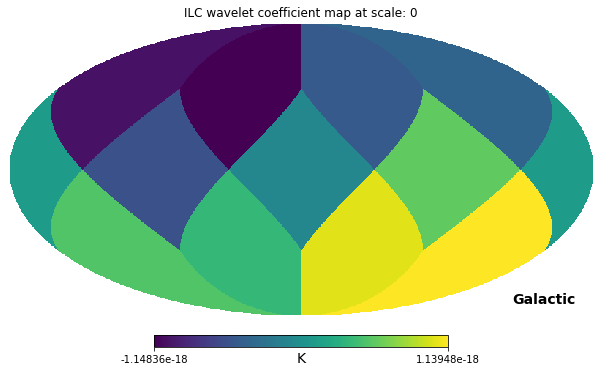

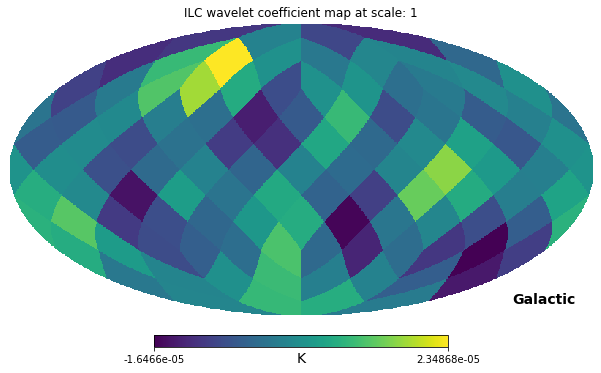

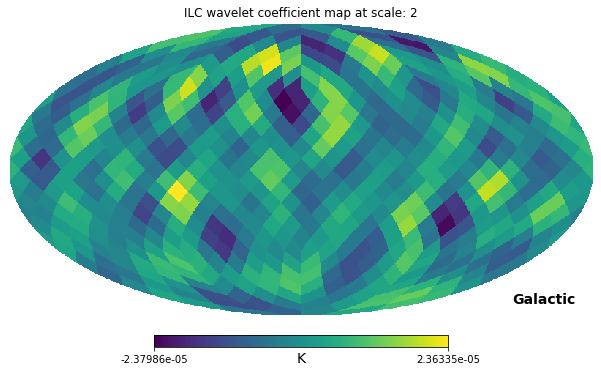

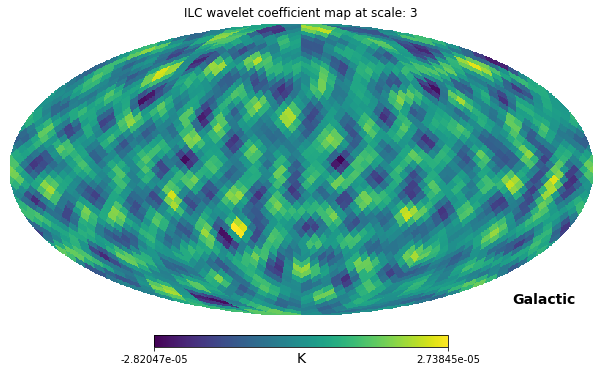

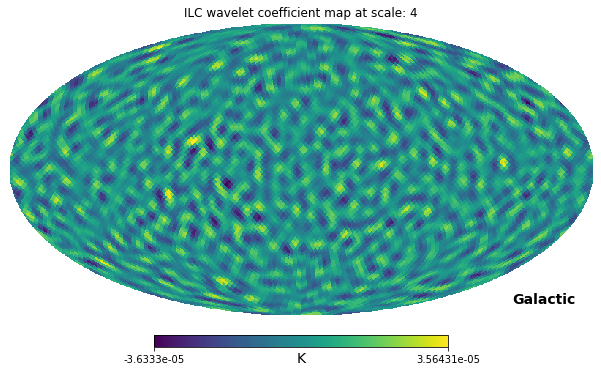

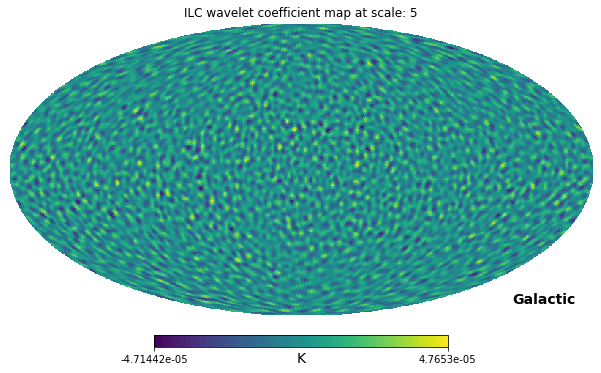

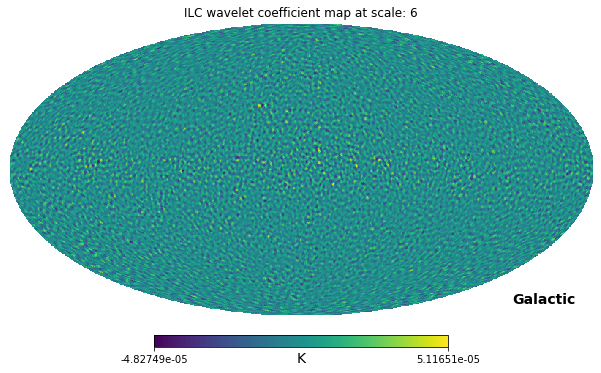

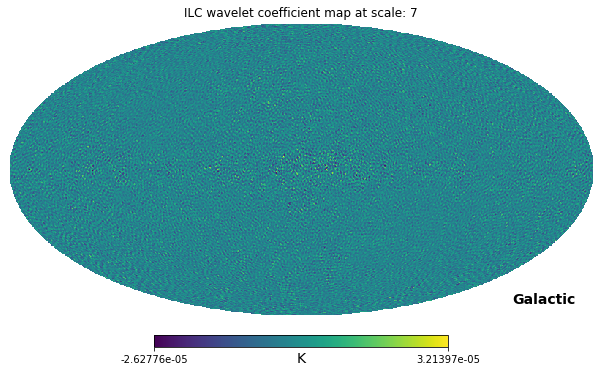

In [8]:
from s2wav import filters
L_max = 256
N_directions = 1
for i in range(1):
    realization = str(realizations[i]).zfill(4)
    trimmed_maps = [np.load(f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S{i}_R{realization}.npy") for i in range(len(scales))]
    for j in range(len(scales)):
        if j != 1 and j != 0:
            visualize_wavelet_coefficient_map(trimmed_maps[j], "ILC wavelet coefficient map at scale: ", str(j-1))
        if j ==0:
            visualize_wavelet_coefficient_map(trimmed_maps[j], "ILC wavelet coefficient map at scale: ", str(j))

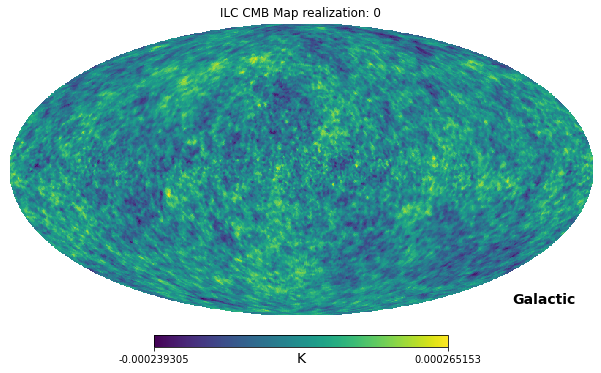

In [11]:
from s2wav import filters
import numpy as np
import s2wav
import s2fft
L_max = 256
N_directions = 1
scales = [0, 1, 2, 3, 4, 5, 6, 7, 8]
realizations = [0]
for i in range(len(realizations)):
    realization = str(realizations[i]).zfill(4)
    trimmed_maps = [np.load(f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S{i}_R{realization}.npy") for i in range(len(scales))]

    filter = filters.filters_directional_vectorised(L_max, N_directions)
    # f_scal = np.array([[0]]) #np.load(f"wavelet_transform/wavelets/scal_coeffs/Scal_MW_Pix_F030.npy") 
    f_scal = np.load(f"wavelet_transform/wavelets/scal_coeffs/Scal_MW_Pix_F100_R{realization}.npy") 

# [np.load(f"wavelet_transform/wavelets/scal_coeffs/Scal_MW_Pix_F{frequencies[i]}.npy") for i in range(len(frequencies))]

    MW_Pix = s2wav.synthesis(trimmed_maps, L = L_max, f_scal = f_scal, filters = filter, N = 1)
    title = "ILC CMB Map realization: "
    visualize_wavelet_coefficient_map(MW_Pix, title, str(realizations[i]))
    np.save(f"ILC/synthesized_ILC_MW_maps/ILC_MW_Map_R{realization}", MW_Pix)

In [61]:
# Total = np.load("ILC/synthesized_ILC_MW_maps/ILC_MW_Map_R0000.npy")
# Total.shape
# visualize_wavelet_coefficient_map(Total, "Total CMB Difference Mask", "R0000")
Total2 = hp.read_map("CMB_total/CMB_HP_Map_F030_L256_R0000.fits")

In [62]:
def hp_pix_2_mw_pix(hp_pix, lmax):
    mw_pix = np.real(s2fft.inverse(hp_alm_2_mw_alm(hp.map2alm(hp_pix, lmax-1),lmax),lmax))
    return mw_pix

def hp_map_2_hp_alm(healpix_map, L_max):
    hp_alm = hp.map2alm(healpix_map, lmax=L_max - 1)
    return hp_alm

def hp_alm_2_mw_alm(hp_alm, L_max):
    MW_alm = np.zeros((L_max, 2 * L_max - 1), dtype=np.complex128)

    for l in range(L_max):
        for m in range(-l, l + 1):
            index = hp.Alm.getidx(L_max - 1, l, abs(m))
            if m < 0:
                MW_alm[l, L_max + m - 1] = (-1) ** m * np.conj(hp_alm[index])
            else:
                MW_alm[l, L_max + m - 1] = hp_alm[index]

    return MW_alm

total_12121 = hp_pix_2_mw_pix(Total2, 256)

030
044
070
100
143
217
353
545
857


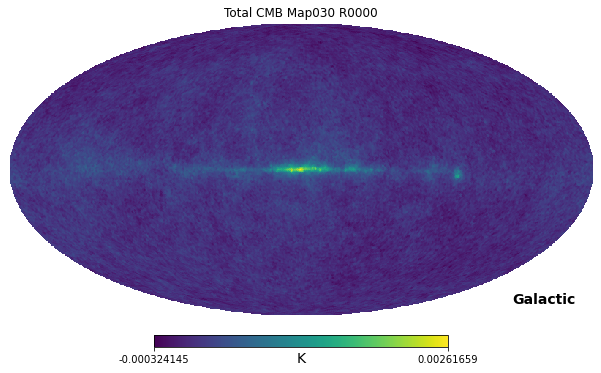

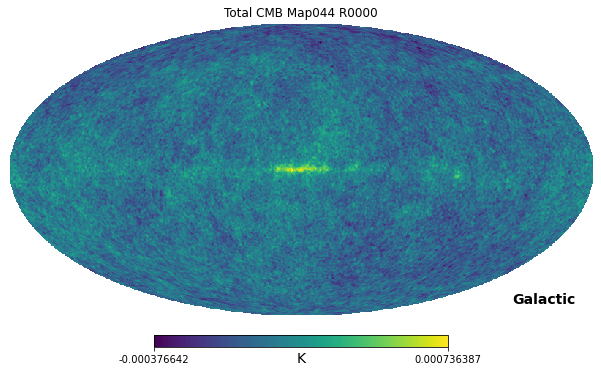

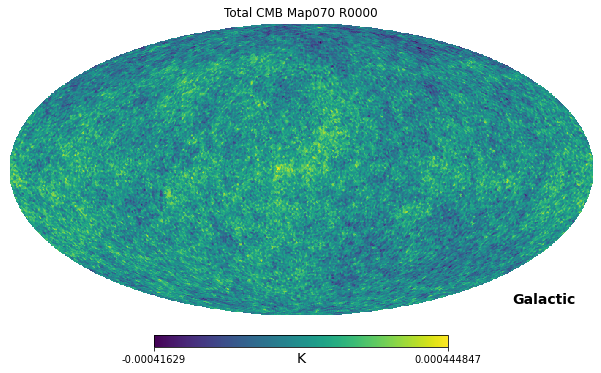

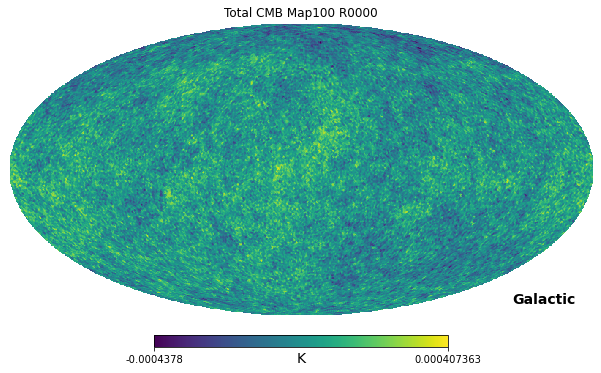

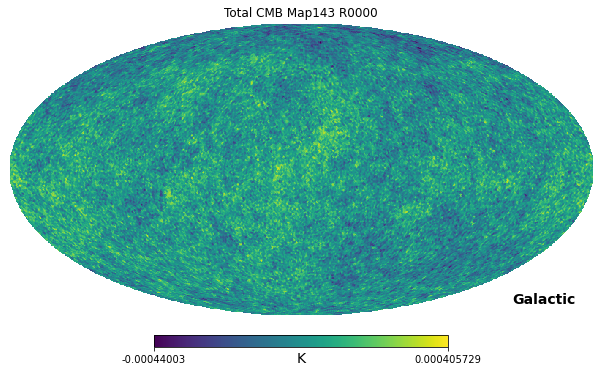

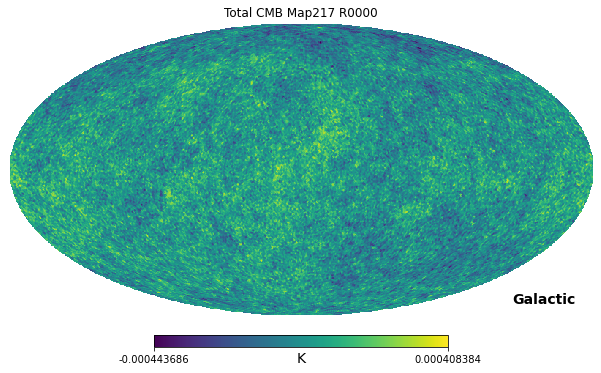

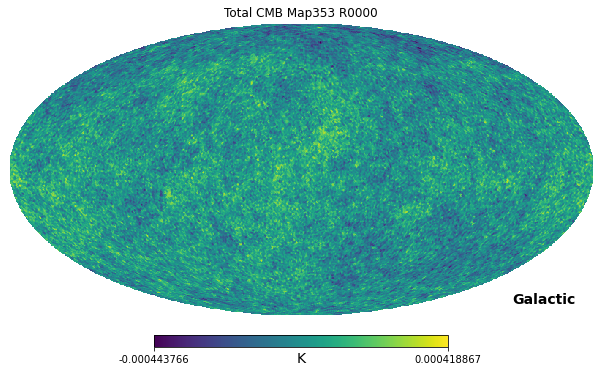

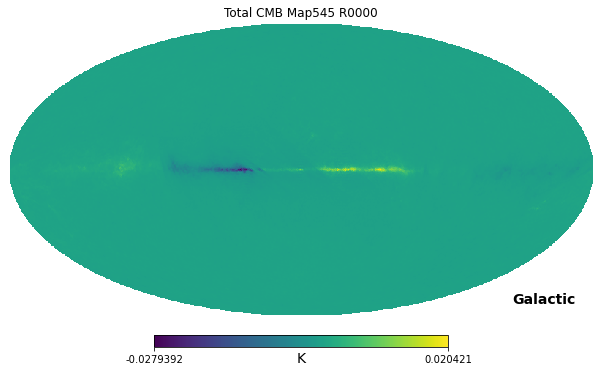

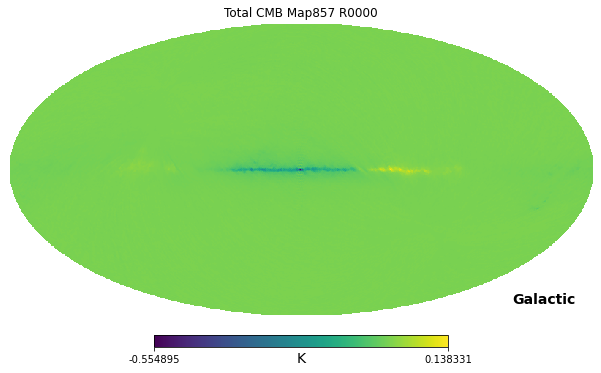

In [64]:
frequencies = ['030', '044', '070', '100', '143', '217', '353', '545', '857']

for i in range(len(frequencies)):
    print(frequencies[i])
    Total = hp.read_map(f"CMB_total/CSN_HP_Map_F{frequencies[i]}_L256_R0000.fits")
    Total = hp_pix_2_mw_pix(Total, 256)
    visualize_wavelet_coefficient_map(Total, "Total CMB Map" + frequencies[i], " R0000")


array([-1.10248570e-04, -1.19247561e-04, -1.45838110e-04, ...,
        1.24104451e-04,  1.10371397e-04,  2.02360286e-05])

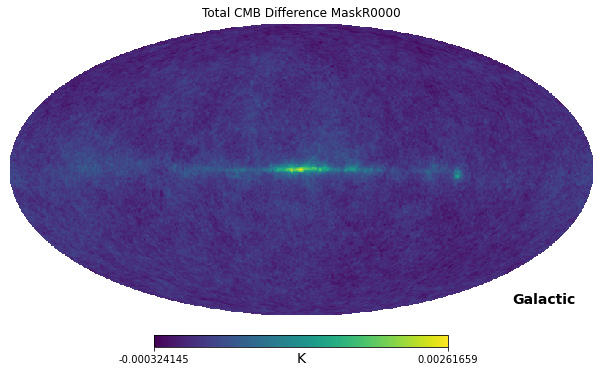

In [50]:
visualize_wavelet_coefficient_map(total2, "Total CMB Difference Mask", "R0000")

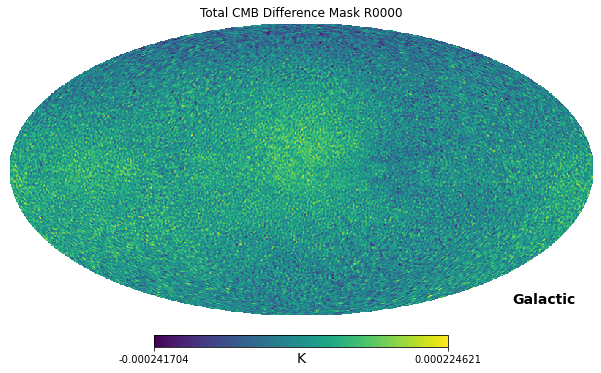

In [63]:
total = visualize_wavelet_coefficient_map(total_12121-MW_Pix, "Total CMB Difference Mask ", "R0000")

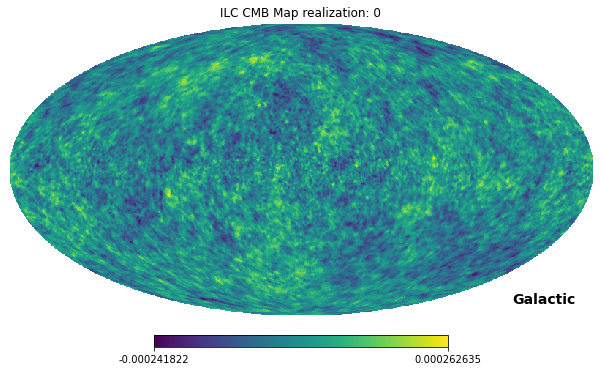

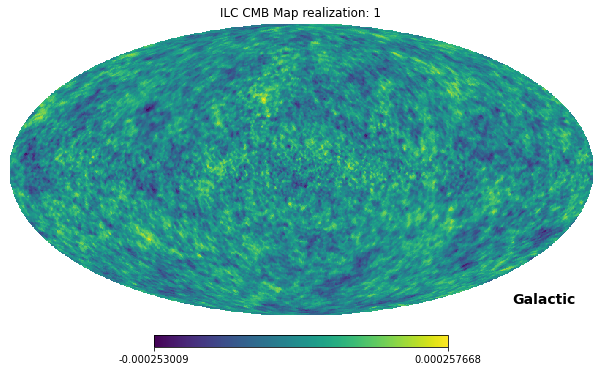

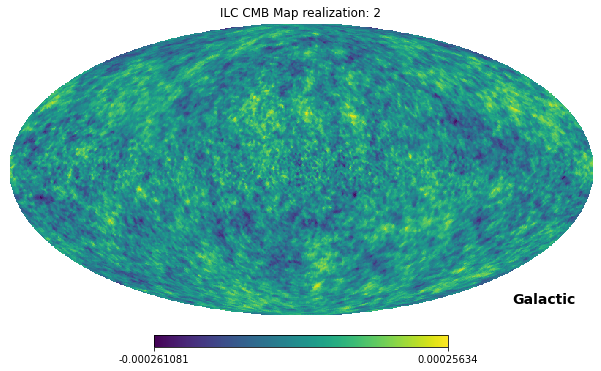

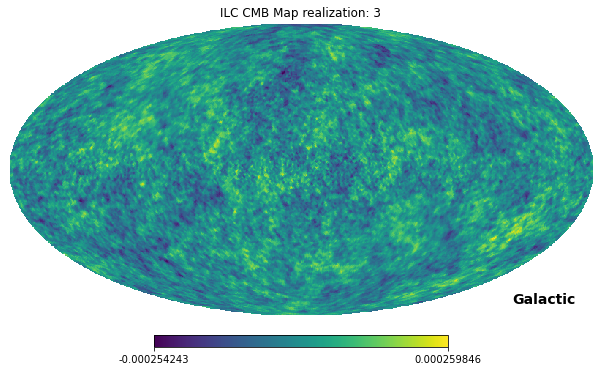

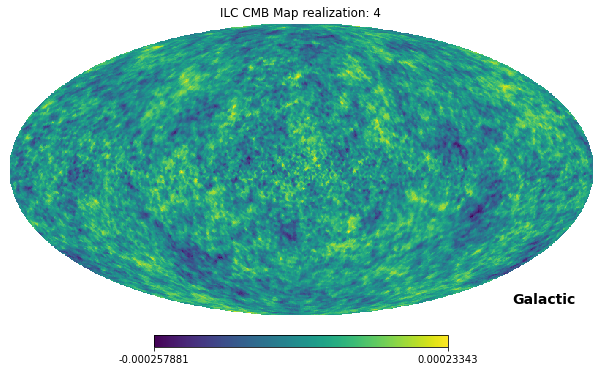

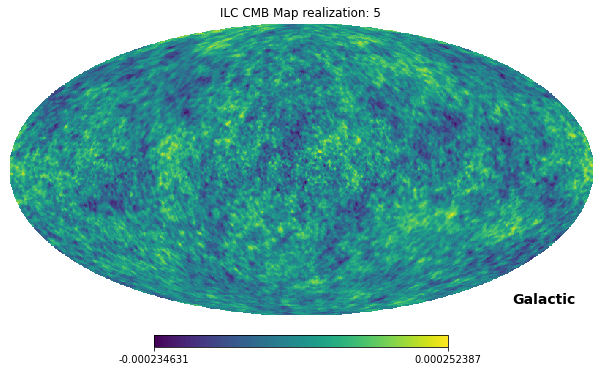

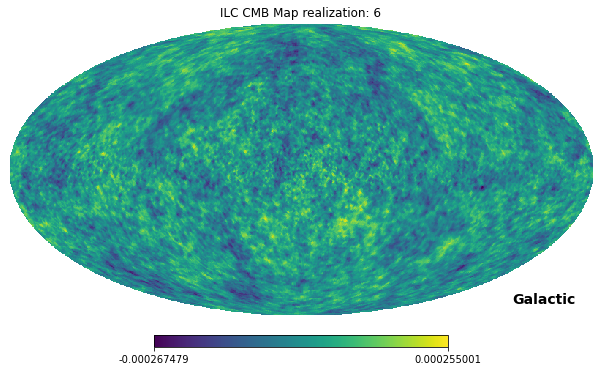

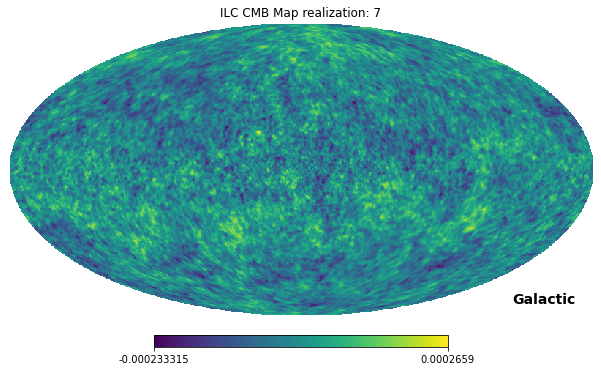

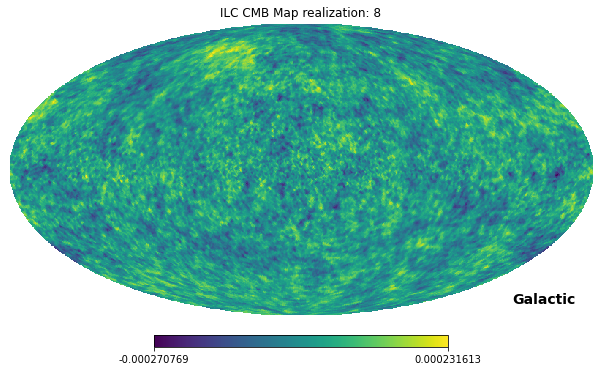

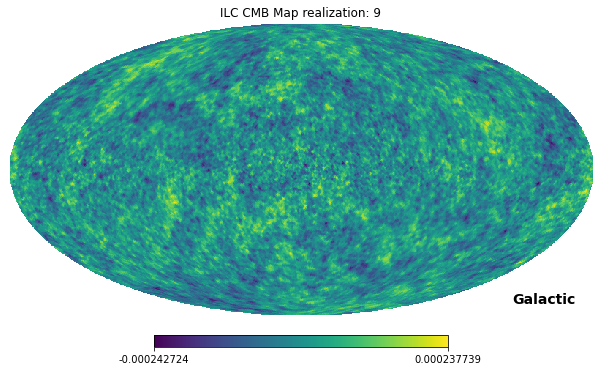

In [18]:
from s2wav import filters
L_max = 256
N_directions = 1
for i in range(len(realizations)):
    realization = str(realizations[i]).zfill(4)
    trimmed_maps = [np.load(f"ILC/ILC_processed_wavelet_maps/ILC_processed_wav_Map_S{i}_R{realization}.npy") for i in range(len(scales))]

    filter = filters.filters_directional_vectorised(L_max, N_directions)
    # f_scal = np.array([[0]]) #np.load(f"wavelet_transform/wavelets/scal_coeffs/Scal_MW_Pix_F030.npy") 
    f_scal = np.array([[0]])    
# [np.load(f"wavelet_transform/wavelets/scal_coeffs/Scal_MW_Pix_F{frequencies[i]}.npy") for i in range(len(frequencies))]

    MW_Pix = s2wav.synthesis(trimmed_maps, L = L_max, f_scal = f_scal, filters = filter, N = 1)
    title = "ILC CMB Map realization: "
    visualize_wavelet_coefficient_map(MW_Pix, title, str(realizations[i]))
    np.save(f"ILC/synthesized_ILC_MW_maps/ILC_MW_Map_R{realization}_0", MW_Pix)

In [44]:
def read_healpix_map(CMB_map_path, title, plot = False):
    print(os.path.exists(CMB_map_path))
    original_healpix_map = hp.read_map(CMB_map_path)
    
    # if frequency == "545":
    #     original_healpix_map = original_healpix_map/58.0356
    # if frequency == "857":
    #     original_healpix_map = original_healpix_map/2.2681
    
    if plot:
        hp.mollview(
            original_healpix_map,
            coord=["G"],
            title=title,
            unit=r"$μ$K",
            # min=-300,
            # max=300,
        )
        plt.show()
    return original_healpix_map

Realization 0000
True


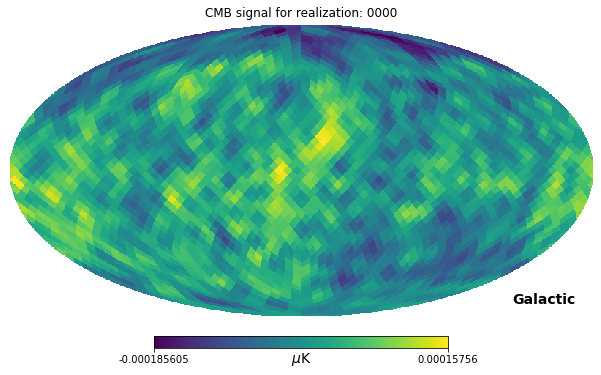

Realization 0001
True


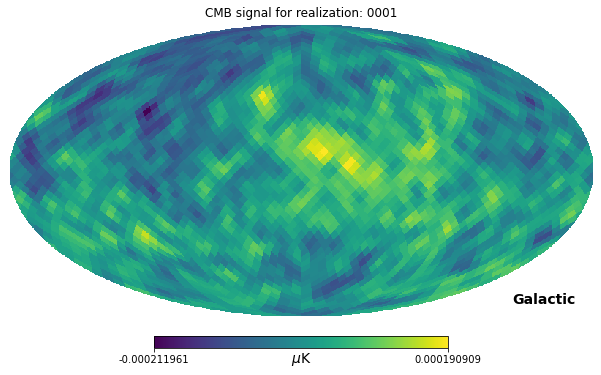

Realization 0002
True


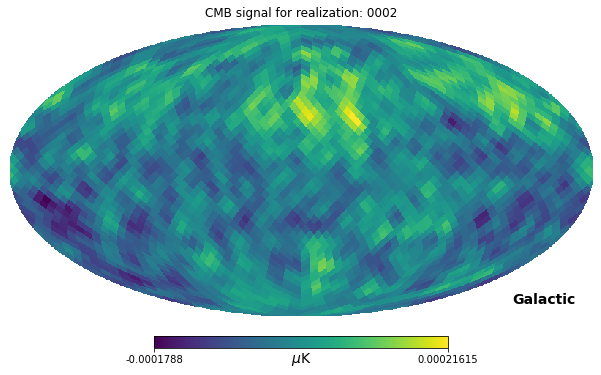

Realization 0003
True


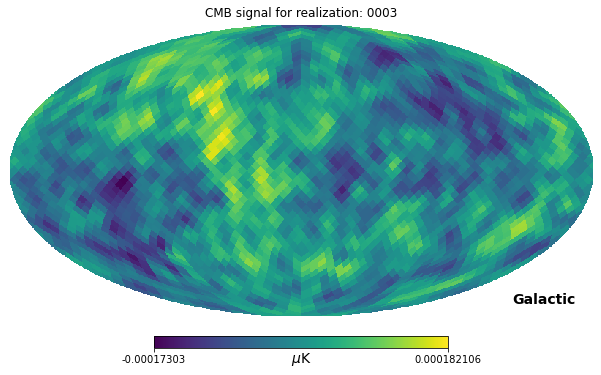

Realization 0004
True


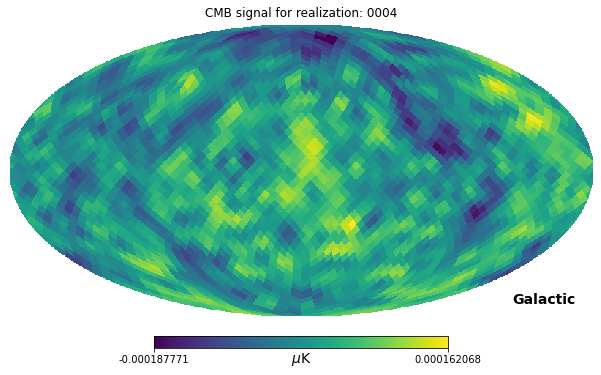

Realization 0005
True


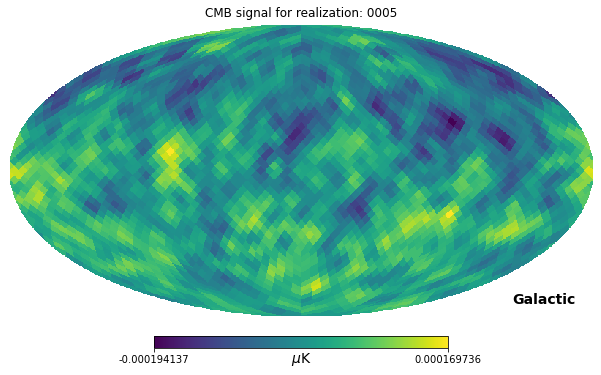

Realization 0006
True


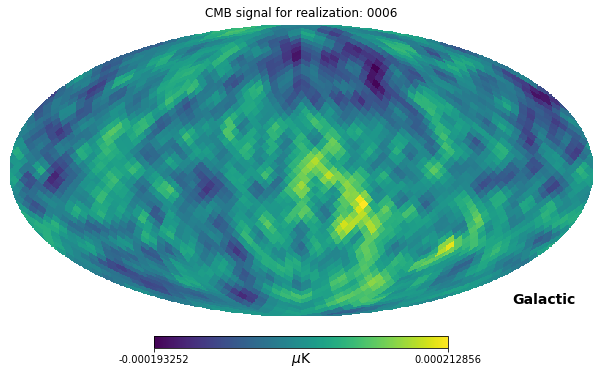

Realization 0007
True


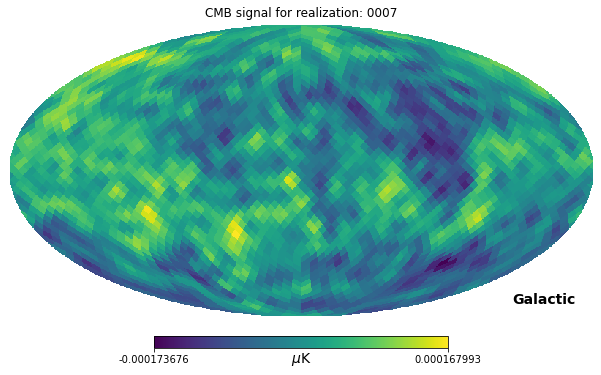

Realization 0009
True


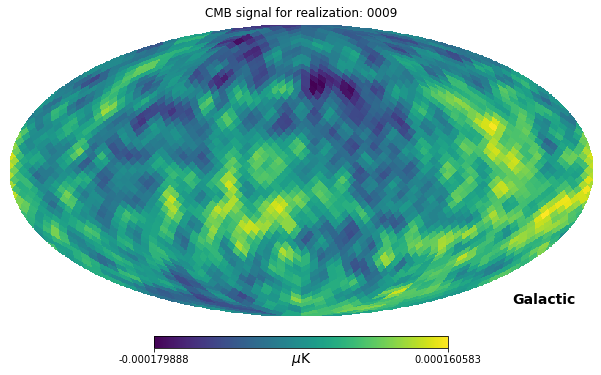

In [45]:

for i in range(len(realizations)):
    realization = str(realizations[i]).zfill(4)
    print(f"Realization {realization}")
    read_healpix_map(f"CMB_total/CMB_HP_Map_F030_L32_R{realization}.fits","CMB signal for realization: " +str(realization), plot = True)

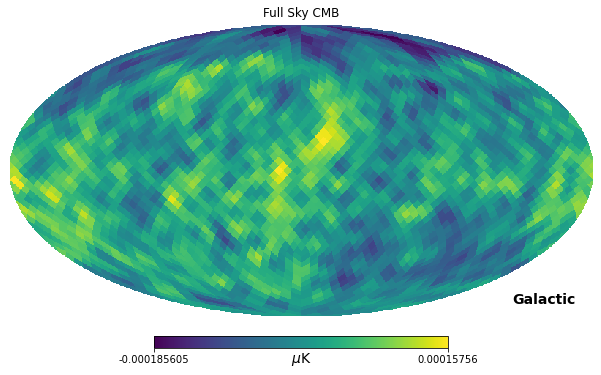

In [26]:
cmb_hp = read_healpix_map("/home/max/CMB_plot/code/CMB_total/CMB_HP_Map_F030_L32_R0000.fits","30",True)

In [38]:
ILC_hp_alm = mw_alm_2_hp_alm(MW_Pix, L_max-1)
print(ILC_hp_alm.shape)
print(MW_Pix.shape)

# new_hp_map = hp.alm2map(ILC_hp_alm, nside=(L_max - 1)//2)
new_hp_map = hp.alm2map(ILC_hp_alm, nside=(L_max - 1)//2)
print(new_hp_map.shape)
print(cmb_hp.shape)

(528,)
(32, 63)
(2700,)
(3072,)


In [40]:
L_max = 32
original_hp_alm = hp.map2alm(cmb_hp, lmax=L_max-1)
original_new_map = hp.alm2map(original_hp_alm, nside=(L_max - 1)//2)
print(original_hp_alm.shape)
print(original_new_map.shape)

(528,)
(2700,)


In [45]:
sum((np.real(ILC_hp_alm)-np.real(original_hp_alm)))/ len(ILC_hp_alm)

0.00032835748113912766

[0.00032953-7.38595322e-21j 0.00036075-9.16149260e-21j
 0.00040678-5.72930343e-21j 0.00034566-5.46613759e-21j
 0.00032808-7.31554886e-21j 0.00034979-7.55761210e-21j
 0.00033762-6.36826353e-21j 0.00032261-9.72187171e-21j
 0.00032642-6.28486885e-21j 0.00032234-5.97475729e-21j
 0.00032421-6.79800235e-21j 0.00031942-6.28540898e-21j
 0.00032181-8.22569909e-21j 0.0003294 -8.14661691e-21j
 0.00033283-1.01194767e-20j 0.00034362-3.54024650e-21j
 0.00033576-7.22473372e-21j 0.00034311-1.13755575e-20j
 0.000334  -5.88626077e-21j 0.00032331-5.83230338e-21j
 0.00032622-6.14630781e-21j 0.00032483-5.75167600e-21j
 0.00032549-4.79608083e-21j 0.00032391-8.39169832e-21j
 0.00033186-5.84778518e-21j 0.00032958-7.19316788e-21j
 0.0003223 -7.18678616e-21j 0.0003249 -7.39075892e-21j
 0.00032871-6.27829401e-21j 0.00032314-6.46640554e-21j
 0.00032398-6.98200791e-21j 0.0003337 -7.05460137e-21j
 0.00033746-2.94824652e-05j 0.00034211+1.33700776e-05j
 0.0003404 -2.25048717e-05j 0.00031981-3.11964653e-06j
 0.0003250

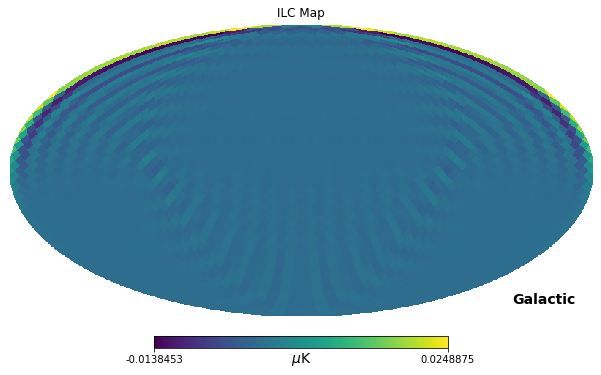

In [50]:
corrected_hp_alm = (ILC_hp_alm-0.0003)
corrected_hp_alm = (ILC_hp_alm)
print((corrected_hp_alm - original_hp_alm))

corrected_hp_map = hp.alm2map(corrected_hp_alm, nside=(L_max - 1)//2)
hp.mollview(
    corrected_hp_map,
    coord=["G"],
    title="ILC Map",
    unit=r"$μ$K",
    # min=-300,
    # max=300,
)

In [39]:
ILC_hp_alm-original_hp_alm

array([0.00032953-7.38595322e-21j, 0.00036075-9.16149260e-21j,
       0.00040678-5.72930343e-21j, 0.00034566-5.46613759e-21j,
       0.00032808-7.31554886e-21j, 0.00034979-7.55761210e-21j,
       0.00033762-6.36826353e-21j, 0.00032261-9.72187171e-21j,
       0.00032642-6.28486885e-21j, 0.00032234-5.97475729e-21j,
       0.00032421-6.79800235e-21j, 0.00031942-6.28540898e-21j,
       0.00032181-8.22569909e-21j, 0.0003294 -8.14661691e-21j,
       0.00033283-1.01194767e-20j, 0.00034362-3.54024650e-21j,
       0.00033576-7.22473372e-21j, 0.00034311-1.13755575e-20j,
       0.000334  -5.88626077e-21j, 0.00032331-5.83230338e-21j,
       0.00032622-6.14630781e-21j, 0.00032483-5.75167600e-21j,
       0.00032549-4.79608083e-21j, 0.00032391-8.39169832e-21j,
       0.00033186-5.84778518e-21j, 0.00032958-7.19316788e-21j,
       0.0003223 -7.18678616e-21j, 0.0003249 -7.39075892e-21j,
       0.00032871-6.27829401e-21j, 0.00032314-6.46640554e-21j,
       0.00032398-6.98200791e-21j, 0.0003337 -7.0546013

In [47]:
display(original_new_map-new_hp_map)

array([-0.00251975, -0.01985767, -0.01987618, ..., -0.00014957,
       -0.00018406,  0.00032854])

In [ ]:
base_path = "wavelet_transform/wavelets/wav_MW_maps"
# file_template = "Wav_MW_Pix_F{}_S{}_R{}.npy"
# frequencies = ['030', '044', '070', '100', '143', '217', '353', '545', '857']
# scales = [0, 1, 2, 3, 4, 5]
# realizations = [0]
# for realization in realizations:
#     realization = str(realization).zfill(4)

#     original_wavelet_c_j = load_frequency_data(base_path, file_template, frequencies, scales, realization)

#     double_and_save_wavelet_maps(original_wavelet_c_j, frequencies, scales, realization)

#     doubled_MW_wav_c_j = load_frequency_data("ILC/wavelet_doubled/", "Wav_Pix2_F{}_S{}_R{}.npy", frequencies, scales, realization)

#     # doubled_MW_wav_c_j = load_frequency_data("ILC/wavelet_doubled/", "Wav_Pix2_F{}_S{}_R{realization:04d}.npy", frequencies, scales)
#     print(doubled_MW_wav_c_j.keys())

#     for i in range(len(scales)):      
#         scale = i
#         print("Calcuate covariance for Scale", i)
        
#         calculate_covariance_matrix(frequencies, doubled_MW_wav_c_j,scale, realization)

#     F_str = '_'.join(frequencies)
#     R_covariance = [np.load(f"ILC/covariance_matrix/cov_MW_Pix2_F{F_str}_S{i}_R{realization}_Full.npy")for i in range(len(scales))]
#     print(len(R_covariance))
#     print(R_covariance[0].shape)  

#     for scale in range(len(R_covariance)):
#         print(scale)
#         process_and_save_matrices(R_covariance[scale], scale, realization)
#     weight_vector_load = [np.load(f"ILC/weight_vector_data/weight_vector_S{i}_R{realization}.npy") for i in range(len(scales))]

#     doubled_maps = []
#     for i in range(len(scales)):
#         doubled_maps.append(create_doubled_ILC_map(frequencies, scales[i], weight_vector_load, doubled_MW_wav_c_j, realization = realization))
#     # doubled_map = create_doubled_map(frequencies, scales)

#     doubled_maps = [np.load(f"ILC/ILC_doubled_maps/ILC_Map_S{i}_R{realization}.npy") for i in range(len(scales))]



#     trimmed_maps = [trim_to_original(doubled_maps[i])[np.newaxis, ...] for i in range(len(scales))]
# for i in range(len(scales)):
#     visualize_wavelet_coefficient_map(trimmed_maps[i], "ILC")

    